In [1]:
!pip install seaborn
!pip install keras
!pip install tensorflow-gpu

    100% |████████████████████████████████| 184kB 2.2MB/s 
  Running setup.py bdist_wheel for seaborn ... - \ done
  Stored in directory: /home/carnd/.cache/pip/wheels/59/10/63/af632c81af65a5acca29220158270dc767927a81650acffcb5
Successfully built seaborn
You are using pip version 8.1.2, however version 9.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
    100% |████████████████████████████████| 235kB 3.5MB/s 
  Running setup.py bdist_wheel for keras ... - \ done
  Stored in directory: /home/carnd/.cache/pip/wheels/c2/80/ba/2beab8c2131e2dcc391ee8a2f55e648af66348115c245e0839
Successfully built keras
You are using pip version 8.1.2, however version 9.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
    100% |████████████████████████████████| 89.2MB 15kB/s 
    100% |████████████████████████████████| 5.7MB 237kB/s 
    100% |████████████████████████████████| 890kB 1.6MB/s 
    100% |███████████

In [1]:
ROOT_DIR = "./Stochastic-Process-Calibration-Dissertation"

# .h5 Keras Weight File Storage Directories:

## Mutliple Output Fully Conected Neural Network
H5_DIR_FULLYCONNECTED_MULTIPLE_RELU = "fullyconnected_multiple.h5"
H5_DIR_FULLYCONNECTED_MULTIPLE_ELU = "fullyconnected_multiple_elu.h5"

## Multiple Output Convolutional Networks
H5_DIR_COVNET_MULTIPLE_RELU = "covnet_multiple_running.h5"
H5_DIR_COVNET_MULTIPLE_ELU = "covnet_multiple_elu.h5"

## Single Output Convolution Networks
H5_DIR_COVNET_JUMP_SIGMA = "covnet_jump_sigma_running.h5"
H5_DIR_COVNET_JUMP_MU = "covnet_jump_mu_running.h5"
H5_DIR_COVNET_LAMBDA = "covnet_lambda_running.h5"

## Ensembling Network
H5_DIR_ENSEMBLING = "ff_ensembling_large.h5"

In [2]:
import seaborn as sns
sns.set(color_codes=True)
sns.set_style(style='white')
sns.set(font_scale=1.6)

In [3]:
import tensorflow as tf
import pandas as pd
import math
import numpy
import random
import decimal
import scipy.linalg
import statsmodels.api as sm
from scipy import stats
from scipy.stats import chisquare
import numpy as np
import numpy.random as nrand
import matplotlib.pyplot as plt
import pylab
from sklearn import svm
import itertools
import sklearn
from sklearn.metrics import r2_score
%matplotlib inline

In [4]:
import keras
from keras.models import Model, Sequential, model_from_json, load_model
from keras.layers import Input, Dense, Dropout, Activation, Flatten, LSTM, BatchNormalization
from keras.layers import Convolution2D, MaxPooling2D, Convolution1D, MaxPooling1D, Conv2D, Input
from keras.optimizers import SGD, Adam, RMSprop
from keras.utils import np_utils
from keras import backend as K
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.layers.core import Reshape

Using TensorFlow backend.


In [5]:
class ModelParameters:
    """
    Encapsulates model parameters
    """
    
    def __init__(self,
                 all_time, all_delta, all_sigma, gbm_mu,
                 jumps_lamda=0.0, jumps_sigma=0.0, jumps_mu=0.0):
        
        # This is the amount of time to simulate for
        self.all_time = all_time
        
        # This is the delta, the rate of time e.g. 1/252 = daily, 1/12 = monthly
        self.all_delta = all_delta
        
        # This is the volatility of the stochastic processes
        self.all_sigma = all_sigma
        
        # This is the annual drift factor for geometric brownian motion
        self.gbm_mu = gbm_mu
        
        # This is the probability of a jump happening at each point in time
        self.lamda = jumps_lamda
        
        # This is the volatility of the jump size
        self.jumps_sigma = jumps_sigma
        
        # This is the average jump size
        self.jumps_mu = jumps_mu
        

def random_model_params():
    return ModelParameters(
        # Fixed Parameters
        all_time=2000,
        all_delta=0.00396825396,
        
        # Random Parameters
        all_sigma = nrand.uniform(0.001,0.2),        
        gbm_mu = nrand.uniform(-1,1),
        jumps_lamda=nrand.uniform(0.0001,0.025),
        jumps_sigma=nrand.uniform(0.001, 0.2),
        jumps_mu=nrand.uniform(-0.5,0.5),
    )

In [6]:
def brownian_motion_log_returns(param):
    """
    This method returns a Wiener process. The Wiener process is also called Brownian motion. For more information
    about the Wiener process check out the Wikipedia page: http://en.wikipedia.org/wiki/Wiener_process
    :param param: the model parameters object
    :return: brownian motion log returns
    """
    sqrt_delta_sigma = math.sqrt(param.all_delta) * param.all_sigma
    return nrand.normal(loc=0, scale=sqrt_delta_sigma, size=param.all_time)

def geometric_brownian_motion_log_returns(param):
    """
    This method constructs a sequence of log returns which, when exponentiated, produce a random Geometric Brownian
    Motion (GBM). GBM is the stochastic process underlying the Black Scholes options pricing formula.
    :param param: model parameters object
    :return: returns the log returns of a geometric brownian motion process
    """
    assert isinstance(param, ModelParameters)
    wiener_process = numpy.array(brownian_motion_log_returns(param))
    sigma_pow_mu_delta = (param.gbm_mu - 0.5 * math.pow(param.all_sigma, 2.0)) * param.all_delta
    return wiener_process + sigma_pow_mu_delta

def jump_diffusion_process(param):
    """
    This method produces a sequence of Jump Sizes which represent a jump diffusion process. These jumps are combined
    with a geometric brownian motion (log returns) to produce the Merton model.
    :param param: the model parameters object
    :return: jump sizes for each point in time (mostly zeroes if jumps are infrequent)
    """
    assert isinstance(param, ModelParameters)
    s_n = time = 0
    small_lamda = -(1.0 / param.lamda)
    jump_sizes = np.zeros(param.all_time)
    while s_n < param.all_time:
        s_n += small_lamda * math.log(random.uniform(0, 1))
        for j in range(0, param.all_time):
            if time * param.all_delta <= s_n * param.all_delta <= (j + 1) * param.all_delta:
                jump_sizes[j] += random.normalvariate(param.jumps_mu, param.jumps_sigma)
                break
        time += 1
    return jump_sizes

def geometric_brownian_motion_jump_diffusion_log_returns(param):
    """
    This method constructs combines a geometric brownian motion process (log returns) with a jump diffusion process
    (log returns) to produce a sequence of gbm jump returns.
    :param param: model parameters object
    :return: returns a GBM process with jumps in it
    """
    assert isinstance(param, ModelParameters)
    jump_diffusion = jump_diffusion_process(param)
    geometric_brownian_motion = geometric_brownian_motion_log_returns(param)
    return numpy.add(jump_diffusion, geometric_brownian_motion)

In [7]:
def test_set_model_params():
    return ModelParameters(
        all_time=2000,
        all_delta=0.00396825396,
        all_sigma = 0.1,
        gbm_mu = 0.05,
        jumps_sigma=0.07,
        jumps_mu=0.05,
        jumps_lamda=0.02)

def standard_convolutional_test_set(sample_size = 1000, dim = (40, 50)):
    test_set = []
    for i in range(sample_size):
        if (i%100 == 0):
            print(i)
        test_set.append(geometric_brownian_motion_jump_diffusion_log_returns(test_set_model_params()))

    test_set_pred = np.reshape(np.array(test_set), (sample_size, dim[0], dim[1], 1))
    return test_set_pred

In [8]:
def r2(y_true, y_pred):
    SSE = K.sum(K.square(y_true-y_pred))
    SST = K.sum(K.square(y_true-K.mean(y_true)))
    return 1-SSE/SST

# Fully Connected Multiple Output Prediction

In [9]:
input_1 = Input(batch_shape = (None, 60))

layer1 = Dense(2048, activation='elu')(input_1)
layer2 = Dense(1024, activation='elu')(layer1)

layer3 = Dense(512, activation='elu')(layer2)
layer4 = Dense(256, activation='elu')(layer3)

layer5 = Dense(128, activation='elu')(layer4)
layer6 = Dense(64, activation='elu')(layer5)

layer7 = Dense(32, activation='elu')(layer5)
last_layer = Dense(16, activation='elu')(layer7)

output1 = Dense(1, name="sigma")(last_layer)
output2 = Dense(1, name="mu")(last_layer)
output3 = Dense(1, name="jump_sigma")(last_layer)
output4 = Dense(1, name="jump_mu")(last_layer)
output5 = Dense(1, name="lambda")(last_layer)

In [10]:
feedforward = Model(input = input_1, output=[output1, output2, output3, output4, output5])

/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  if __name__ == '__main__':


In [11]:
# Compile model
feedforward.compile(loss='mean_squared_error', optimizer='adam', metrics=[r2, 'mean_absolute_percentage_error'])

In [12]:
feedforward_CallBack = keras.callbacks.TensorBoard(log_dir='./feedforward', histogram_freq=0, write_graph=True, write_images=True)

In [13]:
def batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append(mp)
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_moments = [np.append(stats.moment(example, moment = range(2,20)), np.mean(example)) for example in RETURNS_]

        train_statistics = np.array([np.append(train_moments[i], 
                              sm.tsa.stattools.acf(RETURNS_[i])) 
                    for i in range(len(RETURNS_))])
        
        sigmas = np.array([[mp.all_sigma] for mp in PARAMS_])
        mus = np.array([[mp.gbm_mu] for mp in PARAMS_])
        jump_sigmas = np.array([[mp.jumps_sigma] for mp in PARAMS_])
        jump_mus = np.array([[mp.jumps_mu] for mp in PARAMS_])
        lambdas = np.array([[mp.lamda] for mp in PARAMS_])
        
        yield train_statistics, [sigmas, mus, jump_sigmas, jump_mus, lambdas]

train_gen = batch_generator(paramset_size=100, paths_p_paramset=1)

In [14]:
feedforward.load_weights("feedforward_running_gen_2.h5")

In [15]:
#mp.all_sigma, mp.gbm_mu, mp.jumps_sigma, mp.jumps_mu, mp.lamda
mp = ModelParameters(
        # Fixed Parameters
        all_time=2000,
        all_delta=0.00396825396,
        
        # Random Parameters
        
        ### TODO: REDUCED SIGMA #######################
        all_sigma = 0.1,
        ##############################################
        
        gbm_mu = 0.05,
        jumps_sigma=0.07,
        jumps_mu=0.05,
        jumps_lamda=0.02,
    )
test_set = []
for i in range(1000):
    if (i%100 == 0):
        print(i)
    test_set.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))

0
100
200
300
400
500
600
700
800
900


In [16]:

train_moments = [np.append(stats.moment(example, moment = range(2,20)), np.mean(example)) for example in test_set]

train_statistics2 = np.array([np.append(train_moments[i], 
                              sm.tsa.stattools.acf(test_set[i])) 
                    for i in range(len(test_set))])

In [17]:
#histories2 = np.load("feedforward_mo_histories.npy").tolist()
#ff_predicts = np.load("ff_predicts.npy").tolist()
histories2 = []
ff_predicts = []

In [ ]:
for i in range(1000):
    history = feedforward.fit_generator(train_gen, steps_per_epoch = 25, epochs = 1)
    histories2.append(history.history)
    ff_predicts.append(feedforward.predict(train_statistics2))
    
    feedforward.save_weights("feedforward_running_gen_2.h5")
    
    np.save("feedforward_mo_histories.npy", histories2)
    np.save("ff_predicts.npy", ff_predicts)
    
    if i%10 == 0:
        
    
        !git config --global user.email "rwmmostert@gmail.com"
        !git config --global user.name "RWMostert"
        !git add --all
        !git commit -am "updated history, predictions and model"
        !git push -u origin master --quiet

Epoch 1/1
25/25 [==============================] - 30s - loss: 0.5380 - sigma_loss: 0.0151 - mu_loss: 0.3473 - jump_sigma_loss: 0.0161 - jump_mu_loss: 0.1373 - lambda_loss: 0.0222 - sigma_r2: -3.5107 - sigma_mean_absolute_percentage_error: 252.6004 - mu_r2: -0.0548 - mu_mean_absolute_percentage_error: 256.1513 - jump_sigma_r2: -3.8662 - jump_sigma_mean_absolute_percentage_error: 284.8314 - jump_mu_r2: -0.6519 - jump_mu_mean_absolute_percentage_error: 648.3308 - lambda_r2: -438.8708 - lambda_mean_absolute_percentage_error: 2727.3035    
[master a35751f] updated history, predictions and model
 4 files changed, 17 insertions(+), 19 deletions(-)
 rewrite feedforward_mo_histories.npy (98%)
 rewrite ff_predicts.npy (99%)
Branch master set up to track remote branch master from origin.
Epoch 1/1
18/25 [====================>.........] - ETA: 8s - loss: 0.3208 - sigma_loss: 0.0071 - mu_loss: 0.2592 - jump_sigma_loss: 0.0069 - jump_mu_loss: 0.0437 - lambda_loss: 0.0039 - sigma_r2: -1.2285 - sigma

# Covnet Multiple Output prediction

In [6]:
input_1 = Input(shape = (40, 50, 1))

layer1 = Convolution2D(32, 12, 12, border_mode='same', activation='relu')(input_1)
layer2 = Convolution2D(32, 12, 12, activation='relu', border_mode='same')(layer1)
layer3 = MaxPooling2D(pool_size=(2,2))(layer2)

layer4 = Convolution2D(64, 6, 6, border_mode='same', activation='relu')(layer3)
layer5 = Convolution2D(64, 6, 6, activation='relu', border_mode='same')(layer4)
layer6 = MaxPooling2D(pool_size=(2,2))(layer5)

layer7 = Convolution2D(128, 3, 3, border_mode='same', activation='relu')(layer6)
layer8 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(layer7)
layer9 = MaxPooling2D(pool_size=(2,2))(layer8)

flatten = Flatten()(layer9)
last_layer = Dense(256, activation='relu')(flatten)
output1 = Dense(1, name="sigma")(last_layer)
output2 = Dense(1, name="mu")(last_layer)
output3 = Dense(1, name="jump_sigma")(last_layer)
output4 = Dense(1, name="jump_mu")(last_layer)
output5 = Dense(1, name="lambda")(last_layer)

NameError: name 'Input' is not defined

In [37]:
covnet_mo = Model(input = input_1, output=[output1, output2, output3, output4, output5])

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=[<tf.Tenso...)`
  """Entry point for launching an IPython kernel.


In [38]:
covnet_mo.compile('adam', 'mean_squared_error', metrics=['mean_absolute_percentage_error', r2])
covnet_mo.load_weights(H5_DIR_COVNET_MULTIPLE_RELU)

In [30]:
covnet_mo_CallBack = keras.callbacks.TensorBoard(log_dir='./Cov_MO', histogram_freq=0, write_graph=True, write_images=True)

In [18]:
def batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append(mp)
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
        sigmas = np.array([[mp.all_sigma] for mp in PARAMS_])
        mus = np.array([[mp.gbm_mu] for mp in PARAMS_])
        jump_sigmas = np.array([[mp.jumps_sigma] for mp in PARAMS_])
        jump_mus = np.array([[mp.jumps_mu] for mp in PARAMS_])
        lambdas = np.array([[mp.lamda] for mp in PARAMS_])
        
        yield train_data, [sigmas, mus, jump_sigmas, jump_mus, lambdas]

train_gen = batch_generator(paramset_size=10, paths_p_paramset=5)

In [19]:
for i in range(150):
    covnet_mo.fit_generator(train_gen, samples_per_epoch = 300, nb_epoch= 1)
    covnet_mo.save_weights(H5_DIR_COVNET_MULTIPLE_RELU)

Epoch 1/1
300/300 [==============================] - 41s - loss: 0.0137 - sigma_loss: 2.7891e-04 - mu_loss: 0.0101 - jump_sigma_loss: 0.0013 - jump_mu_loss: 0.0020 - lambda_loss: 5.5355e-05 - sigma_mean_absolute_percentage_error: 31.1928 - sigma_r2: 0.8804 - mu_mean_absolute_percentage_error: 39.6531 - mu_r2: 0.9452 - jump_sigma_mean_absolute_percentage_error: 76.5779 - jump_sigma_r2: 0.5831 - jump_mu_mean_absolute_percentage_error: 948.7143 - jump_mu_r2: 0.9804 - lambda_mean_absolute_percentage_error: 67.9296 - lambda_r2: -0.8523     
Epoch 1/1
300/300 [==============================] - 38s - loss: 0.0085 - sigma_loss: 3.3416e-04 - mu_loss: 0.0042 - jump_sigma_loss: 0.0018 - jump_mu_loss: 0.0022 - lambda_loss: 4.7608e-05 - sigma_mean_absolute_percentage_error: 92.9876 - sigma_r2: 0.8530 - mu_mean_absolute_percentage_error: 213.1924 - mu_r2: 0.9848 - jump_sigma_mean_absolute_percentage_error: 126.6458 - jump_sigma_r2: 0.4340 - jump_mu_mean_absolute_percentage_error: 46.4850 - jump_mu_r

KeyboardInterrupt: 

# Covnet Multiple Output with ELUs

In [ ]:
def covnet_multiple_output_with_ELUs():
    def r2(y_true, y_pred):
        SSE = K.sum(K.square(y_true-y_pred))
        SST = K.sum(K.square(y_true-K.mean(y_true)))
        return 1-SSE/SST

    input_1 = Input(shape = (40, 50, 1))

    layer1 = Convolution2D(32, 12, 12, border_mode='same', activation='elu')(input_1)
    layer2 = Convolution2D(32, 12, 12, activation='elu', border_mode='same')(layer1)
    layer3 = MaxPooling2D(pool_size=(2,2))(layer2)

    layer4 = Convolution2D(64, 6, 6, border_mode='same', activation='elu')(layer3)
    layer5 = Convolution2D(64, 6, 6, activation='elu', border_mode='same')(layer4)
    layer6 = MaxPooling2D(pool_size=(2,2))(layer5)

    layer7 = Convolution2D(128, 3, 3, border_mode='same', activation='elu')(layer6)
    layer8 = Convolution2D(128, 3, 3, activation='elu', border_mode='same')(layer7)
    layer9 = MaxPooling2D(pool_size=(2,2))(layer8)

    flatten = Flatten()(layer9)
    last_layer = Dense(256, activation='elu')(flatten)
    output1 = Dense(1, name="sigma")(last_layer)
    output2 = Dense(1, name="mu")(last_layer)
    output3 = Dense(1, name="jump_sigma")(last_layer)
    output4 = Dense(1, name="jump_mu")(last_layer)
    output5 = Dense(1, name="lambda")(last_layer)

    covnet_mo_elu = Model(input = input_1, output=[output1, output2, output3, output4, output5])

    covnet_mo_elu.compile('adam', 'mean_squared_error', metrics=['mean_absolute_percentage_error', r2])
    
    return covnet_mo_elu

In [ ]:
covnet_mo_elu = covnet_multiple_output_with_ELUs()
covnet_mo_elu.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)

In [ ]:
covnet_mo_elu.save(H5_DIR_COVNET_MULTIPLE_ELU)

In [ ]:
def batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append(mp)
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
        sigmas = np.array([[mp.all_sigma] for mp in PARAMS_])
        mus = np.array([[mp.gbm_mu] for mp in PARAMS_])
        jump_sigmas = np.array([[mp.jumps_sigma] for mp in PARAMS_])
        jump_mus = np.array([[mp.jumps_mu] for mp in PARAMS_])
        lambdas = np.array([[mp.lamda] for mp in PARAMS_])
        
        yield train_data, [sigmas, mus, jump_sigmas, jump_mus, lambdas]

train_gen = batch_generator(paramset_size=350, paths_p_paramset=1)

In [ ]:
test_set_pred = standard_convolutional_test_set()

In [13]:
#histories_elu = []
#covnet_mo_elu_predictions = []

In [28]:
for i in range(150000):
    history = covnet_mo_elu.fit_generator(train_gen, samples_per_epoch = 5, nb_epoch = 1)
    
    histories_elu.append(history.history)
    
    predictions_elu = covnet_mo_elu.predict(test_set_pred)
    
    covnet_mo_elu_predictions.append(predictions_elu)
    
    covnet_mo_elu.save_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    np.save("covnet_histories_elu.npy", histories_elu)
    np.save("covnet_mo_elu_predictions.npy", covnet_mo_elu_predictions)

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: The semantics of the Keras 2 argument `steps_per_epoch` is not the same as the Keras 1 argument `samples_per_epoch`. `steps_per_epoch` is the number of batches to draw from the generator at each epoch. Basically steps_per_epoch = samples_per_epoch/batch_size. Similarly `nb_val_samples`->`validation_steps` and `val_samples`->`steps` arguments have changed. Update your method calls accordingly.
  
/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<generator..., steps_per_epoch=5, epochs=1)`
  


Epoch 1/1
5/5 [==============================] - 29s - loss: 0.0111 - sigma_loss: 3.0396e-04 - mu_loss: 0.0034 - jump_sigma_loss: 0.0021 - jump_mu_loss: 0.0053 - lambda_loss: 2.3726e-05 - sigma_mean_absolute_percentage_error: 32.8818 - sigma_r2: 0.9068 - mu_mean_absolute_percentage_error: 56.9365 - mu_r2: 0.9895 - jump_sigma_mean_absolute_percentage_error: 140.2068 - jump_sigma_r2: 0.3505 - jump_mu_mean_absolute_percentage_error: 96.0262 - jump_mu_r2: 0.9355 - lambda_mean_absolute_percentage_error: 55.8387 - lambda_r2: 0.5312     
Epoch 1/1
5/5 [==============================] - 17s - loss: 0.0112 - sigma_loss: 2.6293e-04 - mu_loss: 0.0033 - jump_sigma_loss: 0.0022 - jump_mu_loss: 0.0054 - lambda_loss: 2.1939e-05 - sigma_mean_absolute_percentage_error: 42.7881 - sigma_r2: 0.9198 - mu_mean_absolute_percentage_error: 27.4110 - mu_r2: 0.9897 - jump_sigma_mean_absolute_percentage_error: 132.5531 - jump_sigma_r2: 0.3128 - jump_mu_mean_absolute_percentage_error: 79.5455 - jump_mu_r2: 0.9328 

KeyboardInterrupt: 

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  # This is added back by InteractiveShellApp.init_path()
/home/gerhard/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyboardInterrupt: 

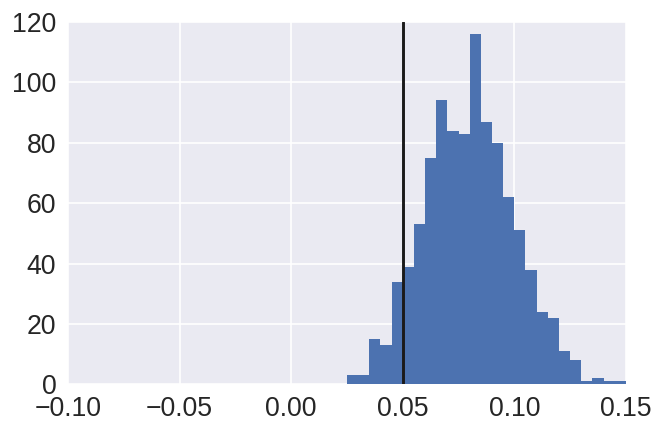

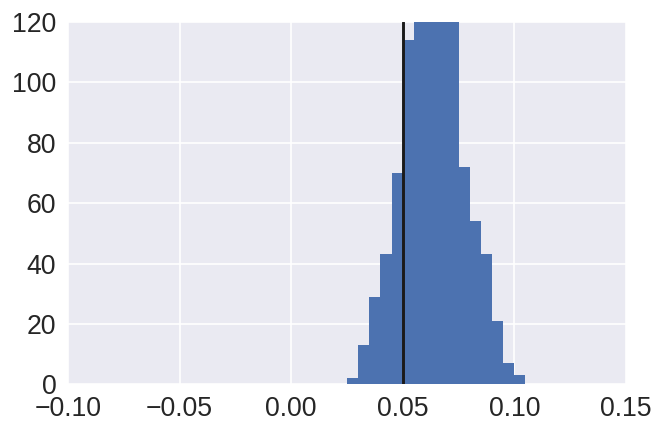

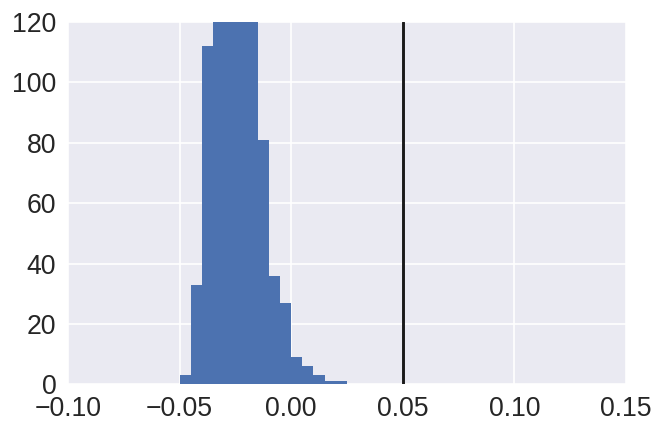

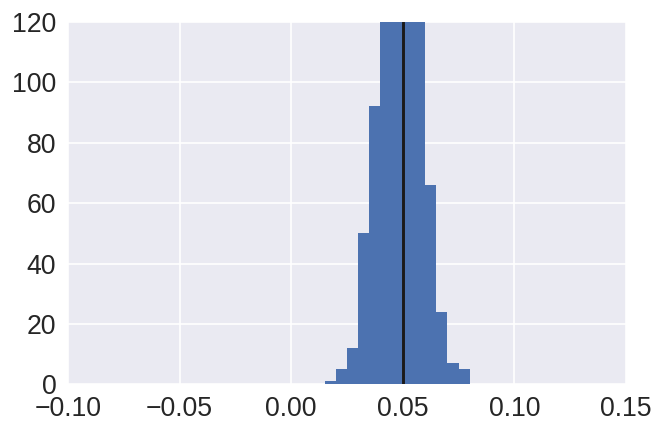

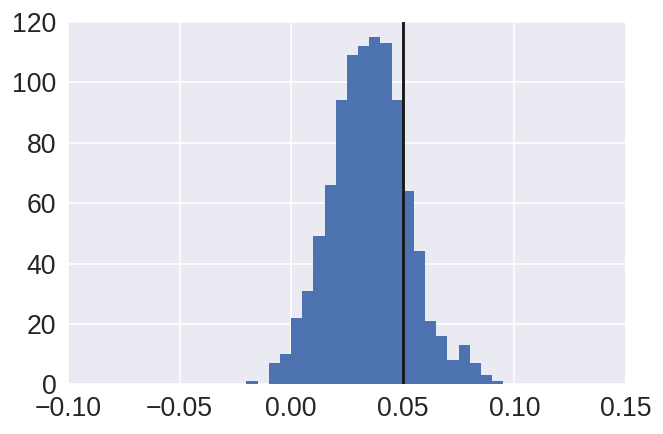

...

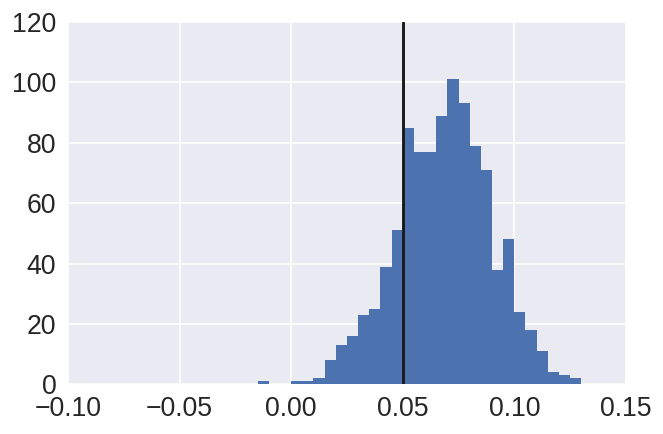

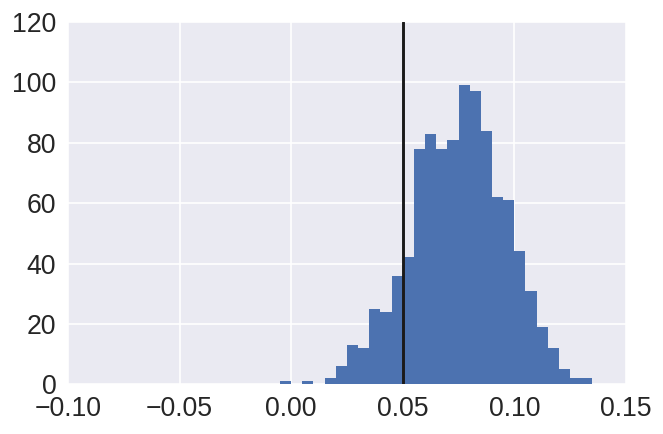

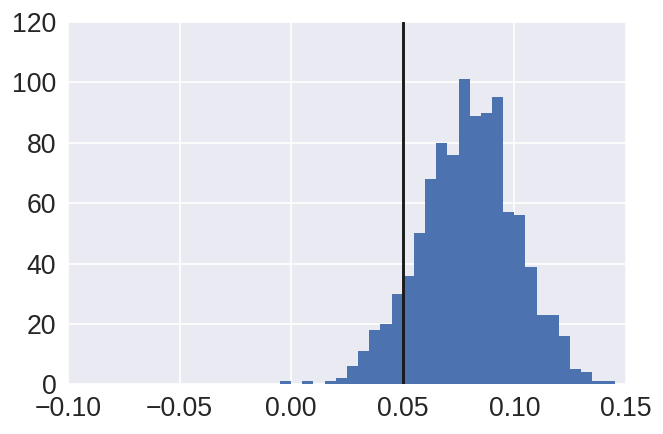

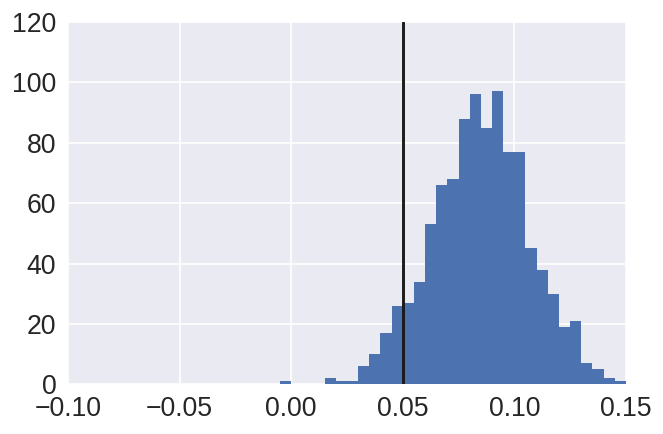

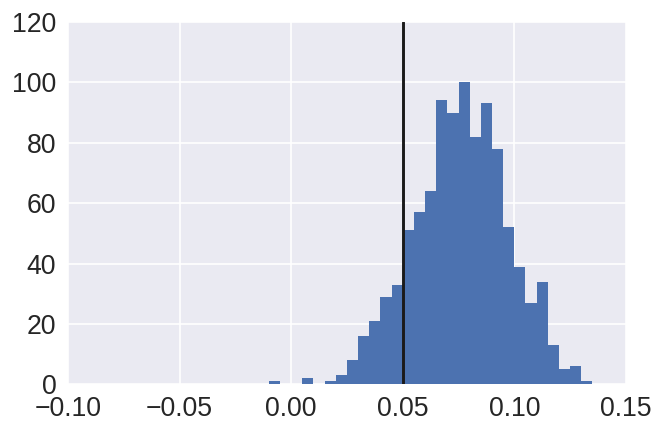

In [33]:
for prediction_elu in covnet_mo_elu_predictions:
    predictions_hist(prediction_elu[3], mp.jumps_mu, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Jumps Mu",
                 min_edge = -0.1,
                 max_edge = 0.15,
                 y_lim = (0, 120),
                 save_to_file = False);

In [ ]:
def predictions_hist(predictions, true_value, plot_title = "model", param_name = "param", min_edge = None, max_edge = None, y_lim = (None, None), bin_size = 0.0025, img_subdir = "/Images/", save_to_file = True):
    
    if min_edge == None:
        min_edge = np.min(predictions)
    
    if max_edge == None:
        max_edge = np.max(predictions)
    
    bin_size = (max_edge-min_edge)/50
    N = (max_edge-min_edge)/bin_size; Nplus1 = N + 1
    bin_list = np.linspace(min_edge, max_edge, Nplus1)

    fig, ax = pylab.subplots()
    pylab.hist(predictions, bins=bin_list, animated = True)
    #pylab.title(plot_title);
    pylab.axvline(x = true_value, c='k')
    pylab.xlim(min_edge, max_edge)
    
    if y_lim != (None, None):
        pylab.ylim(y_lim[0], y_lim[1])
        
    fig.set_dpi(120)
    if save_to_file:
        fig.savefig(ROOT_DIR + img_subdir + plot_title + "_" + param_name + ".png")
    return fig

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  


AttributeError: 'numpy.ndarray' object has no attribute 'set_animated'

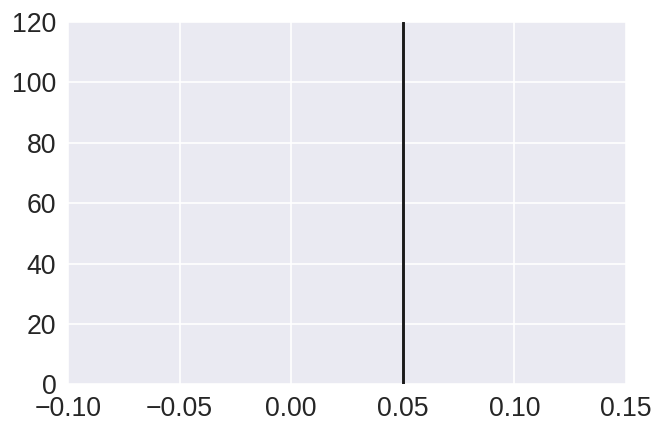

In [60]:

min_edge = -0.1
max_edge = 0.15
y_lim = (0, 120)
            
if min_edge == None:
    min_edge = np.min(predictions)
    
if max_edge == None:
    max_edge = np.max(predictions)
    
bin_size = (max_edge-min_edge)/50
N = (max_edge-min_edge)/bin_size; Nplus1 = N + 1
bin_list = np.linspace(min_edge, max_edge, Nplus1)

predictions = []
true_value = mp.jumps_mu

fig, ax = pylab.subplots()
ln = pylab.hist(predictions, bins=bin_list, animated = True)
#pylab.title(plot_title);
def init():
    pylab.axvline(x = true_value, c='k')
    pylab.xlim(min_edge, max_edge)
    if y_lim != (None, None):
        pylab.ylim(y_lim[0], y_lim[1])
        
    fig.set_dpi(120)
    return ln

def update(frame):
    predictions.append(frame)
    ln.set_data(predictions)
    return ln

ani = animation.FuncAnimation(fig, update, frames=np.array(covnet_mo_elu_predictions)[:,3,:,0], init_func = init, blit = True)
plt.show()

In [64]:
len()

502

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  # This is added back by InteractiveShellApp.init_path()
/home/gerhard/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyboardInterrupt: 

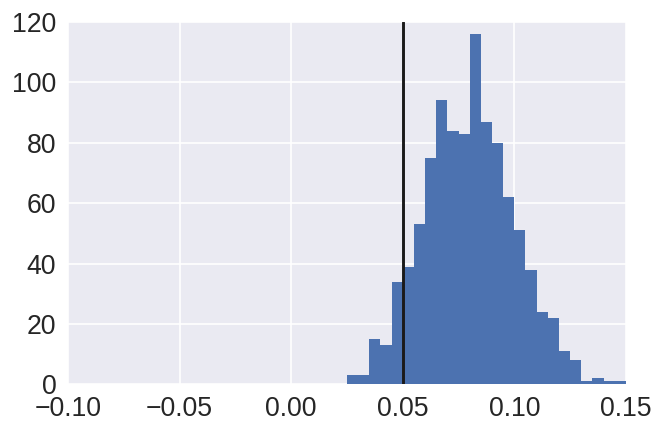

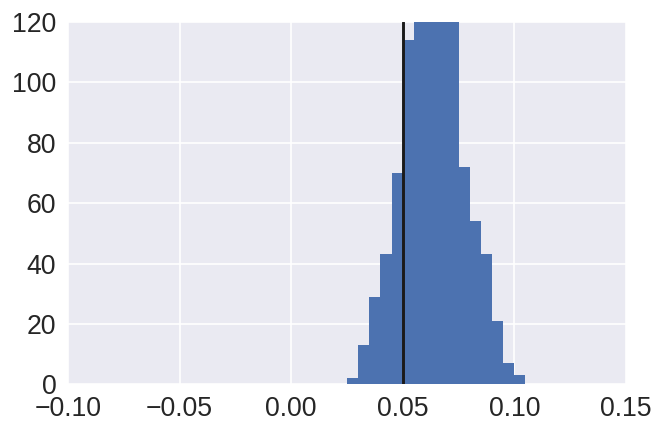

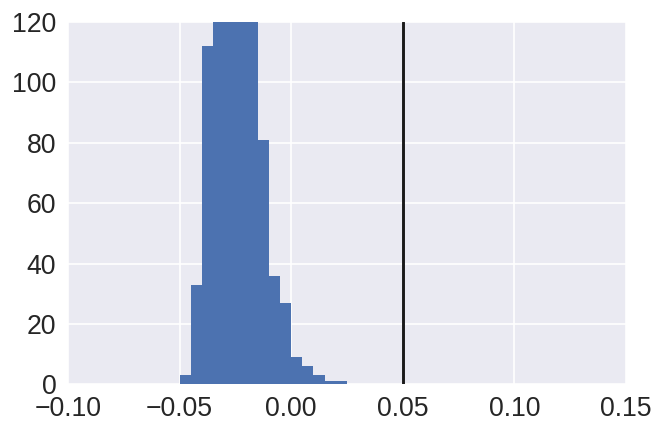

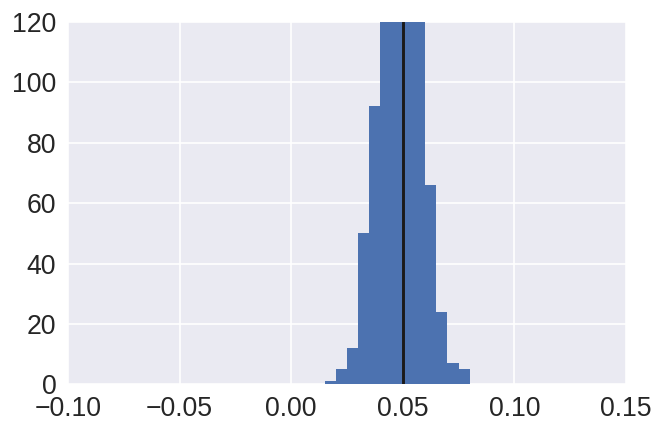

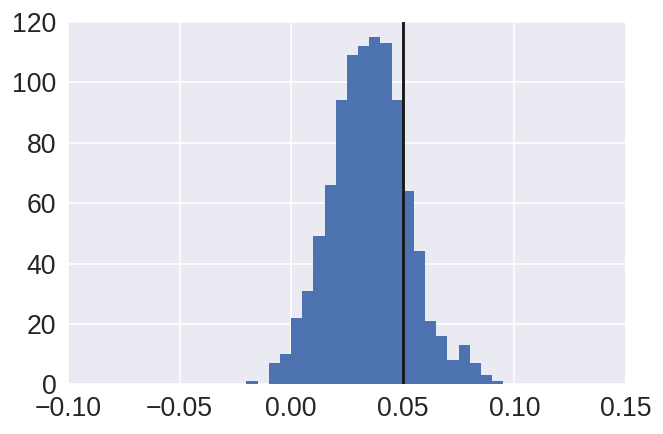

...

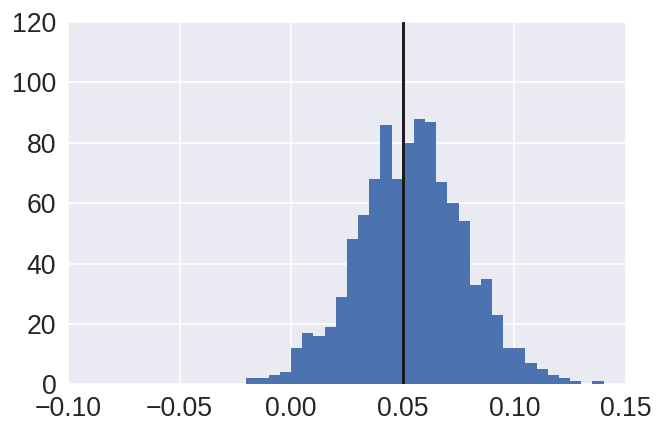

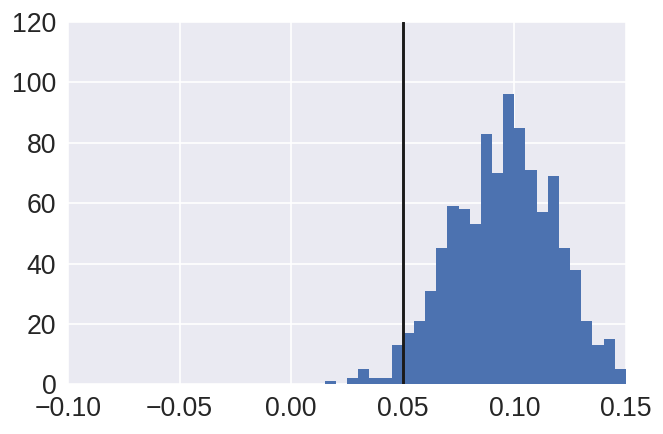

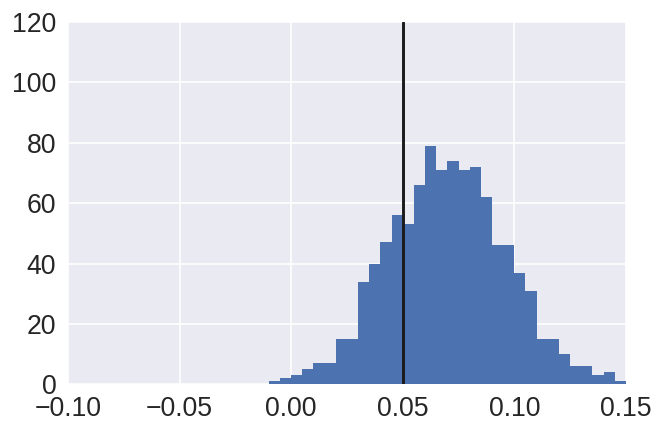

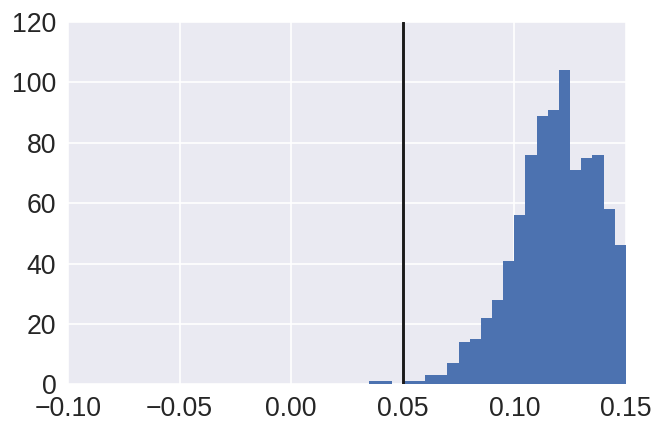

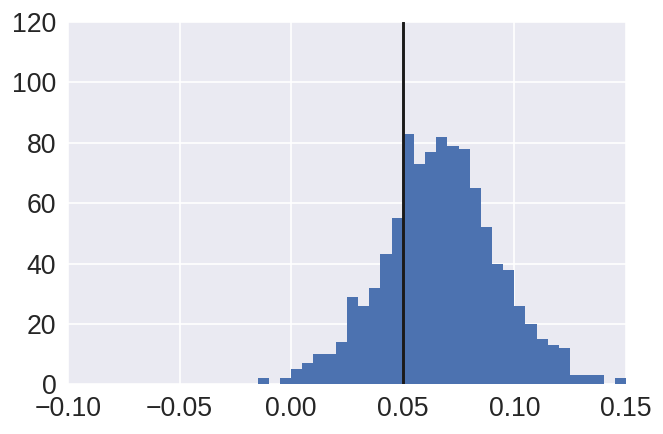

In [65]:
for prediction_elu in np.array(covnet_mo_elu_predictions)[:,3,:,0]:
    predictions_hist(prediction_elu, mp.jumps_mu, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Jumps Mu",
                 min_edge = -0.1,
                 max_edge = 0.15,
                 y_lim = (0, 120),
                 save_to_file = False);

# Covnet Single Output Prediction - Lambda Smaller

In [9]:
def covnet_single_lambda():
    def r2(y_true, y_pred):
        SSE = K.sum(K.square(y_true-y_pred))
        SST = K.sum(K.square(y_true-K.mean(y_true)))
        return 1-SSE/SST

    covnet_lambda = Sequential()
    covnet_lambda.add(Convolution2D(32, 12, 12, input_shape=(40, 50, 1), border_mode='same', activation='relu'))
    covnet_lambda.add(Convolution2D(32, 12, 12, activation='relu', border_mode='same'))
    covnet_lambda.add(MaxPooling2D(pool_size=(2,2)))

    covnet_lambda.add(Convolution2D(64, 6, 6, border_mode='same', activation='relu'))
    covnet_lambda.add(Convolution2D(64, 6, 6, activation='relu', border_mode='same'))
    covnet_lambda.add(MaxPooling2D(pool_size=(2,2)))

    covnet_lambda.add(Flatten())
    covnet_lambda.add(Dense(512, activation='relu'))
    covnet_lambda.add(Dense(1))
    
    covnet_lambda.compile('adam', 'mean_squared_error', metrics=['mean_absolute_percentage_error', r2])
    
    return covnet_lambda

In [10]:
covnet_lambda = covnet_single_lambda()

/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:8: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (12, 12), activation="relu", input_shape=(40, 50, 1..., padding="same")`
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:9: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (12, 12), activation="relu", padding="same")`
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (6, 6), activation="relu", padding="same")`
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:13: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (6, 6), activation="relu", padding="same")`


In [11]:
covnet_lambda_callback = keras.callbacks.TensorBoard(log_dir='./covnet_lambda1', histogram_freq=0, write_graph=True, write_images=True)

In [19]:
def lambda_batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append(mp)
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
        
        lambdas = np.array([[mp.lamda] for mp in PARAMS_])
        
        yield train_data, lambdas

lambda_train_gen = lambda_batch_generator(paramset_size=250, paths_p_paramset=1)

In [15]:
test_set_pred = standard_convolutional_test_set()

0
100
200
300
400
500
600
700
800
900


In [14]:
covnet_lambda.load_weights(H5_DIR_COVNET_LAMBDA)

In [15]:
histories_lambda = np.load("Lambda_histories.npy").tolist()
preds_lambda = np.load("preds_lambda.npy").tolist()

In [16]:
!git config --global user.email "rwmmostert@gmail.com"
!git config --global user.name "RWMostert"

In [26]:
for i in range(15000):
    history = covnet_lambda.fit_generator(lambda_train_gen, steps_per_epoch = 10, epochs = 1, callbacks=[covnet_lambda_callback])
    
    histories_lambda.append(history.history)
    preds_lambda.append(covnet_lambda.predict(test_set_pred))
    
    covnet_lambda.save_weights(H5_DIR_COVNET_LAMBDA)
    if i%10 == 0:
        np.save("Lambda_histories.npy", histories_lambda)
        np.save("preds_lambda.npy", preds_lambda)
        !git add --all
        !git commit -am "Model trained"
        !git push --quiet

Epoch 1/1
10/10 [==============================] - 26s - loss: 7.3309e-06 - mean_absolute_percentage_error: 39.0053 - r2: 0.8540    
[master dca9812] Model trained
 11 files changed, 277 insertions(+), 13 deletions(-)
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646077.ip-172-31-12-159
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646106.ip-172-31-12-159
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646134.ip-172-31-12-159
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646163.ip-172-31-12-159
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646191.ip-172-31-12-159
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646220.ip-172-31-12-159
 create mode 100644 covnet_lambda1/events.out.tfevents.1500646281.ip-172-31-12-159
Git 2.0 from 'matching' to 'simple'. To squelch this message
and maintain the traditional behavior, use:

  git config --global push.default matching

To squelch this message and adopt the new behavior

KeyboardInterrupt: 

In [256]:
histories_lambda = np.load("Lambda_histories.npy")

In [27]:
lambda_mape = []
lambda_mse = []
lambda_r2 = []

for history in histories_lambda:
    lambda_r2.append(history["r2"])
    lambda_mse.append(history["loss"])
    lambda_mape.append(history["mean_absolute_percentage_error"])

In [28]:
lambda_mape = np.reshape(lambda_mape, len(lambda_mape))
lambda_r2 = np.reshape(lambda_r2, len(lambda_r2))
lambda_mse = np.reshape(lambda_mse, len(lambda_mse))

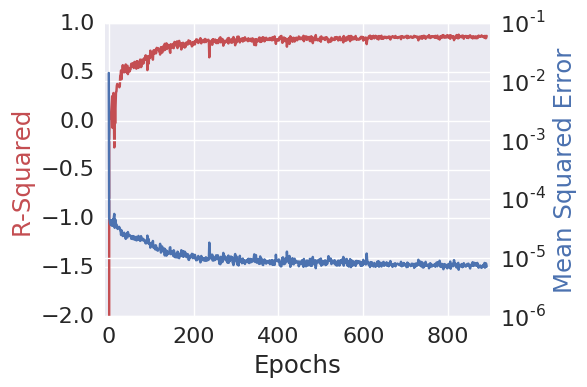

In [35]:
fig, ax1 = plt.subplots()
ax1.plot(lambda_r2, c='r')
ax1.set_xlabel('Epochs')
ax1.set_ylim(-2, 1)
# Make the y-axis label, ticks and tick labels match the line color.
ax1.set_ylabel('R-Squared', color='r')
ax1.tick_params('y', color='r')

ax2 = ax1.twinx()
ax2.plot(lambda_mse)
ax2.set_ylabel('Mean Squared Error', color='b')
ax2.set_yscale('log')
ax2.tick_params('y', color='b')
ax1.set_xlim(-10, 900)

fig.tight_layout()
plt.show()

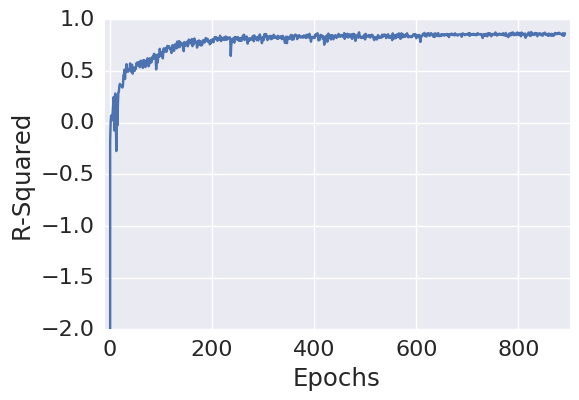

FileNotFoundError: [Errno 2] No such file or directory: './Stochastic-Process-Calibration-Dissertation/Images/Prediction-Convergence/ConvolutionalNN-SingleOutput/Lambda-RSquared.png'

In [33]:
fig = pylab.figure()

pylab.plot(lambda_r2);
pylab.xlim(-10, 900)
pylab.ylim(-2, 1.0);
pylab.xlabel("Epochs")
pylab.ylabel("R-Squared")
pylab.show();

fig.savefig(ROOT_DIR + "/Images/Prediction-Convergence/ConvolutionalNN-SingleOutput/"+"Lambda-RSquared.png")

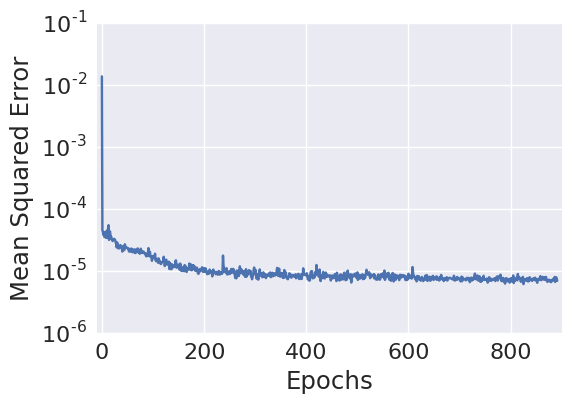

FileNotFoundError: [Errno 2] No such file or directory: './Stochastic-Process-Calibration-Dissertation/Images/Prediction-Convergence/ConvolutionalNN-SingleOutput/Lambda-MSE.png'

In [34]:
fig = pylab.figure()
pylab.plot(lambda_mse)
pylab.yscale('log')
pylab.xlim(-10, 900)
pylab.xlabel("Epochs")
pylab.ylabel("Mean Squared Error")
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Prediction-Convergence/ConvolutionalNN-SingleOutput/"+"Lambda-MSE.png")

# QQ Convnet Single Output Prediction - Jump Mu

In [9]:
covnet_jump_mu = Sequential()
covnet_jump_mu.add(Convolution2D(32, 12, 12, input_shape=(40, 50, 1), border_mode='same', activation='relu'))
covnet_jump_mu.add(Convolution2D(32, 12, 12, activation='relu', border_mode='same'))
covnet_jump_mu.add(MaxPooling2D(pool_size=(2,2)))

covnet_jump_mu.add(Convolution2D(64, 6, 6, border_mode='same', activation='relu'))
covnet_jump_mu.add(Convolution2D(64, 6, 6, activation='relu', border_mode='same'))
covnet_jump_mu.add(MaxPooling2D(pool_size=(2,2)))

covnet_jump_mu.add(Flatten())
covnet_jump_mu.add(Dense(512, activation='relu'))
covnet_jump_mu.add(Dense(1))

/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (12, 12), padding="same", activation="relu", input_shape=(40, 50, 1...)`
  from ipykernel import kernelapp as app
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:3: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (12, 12), padding="same", activation="relu")`
  app.launch_new_instance()
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (6, 6), padding="same", activation="relu")`
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:7: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (6, 6), padding="same", activation="relu")`


In [10]:
covnet_jump_mu.compile('adam', 'mean_squared_error', metrics=['mean_absolute_percentage_error', r2])

In [18]:
def jump_mu_batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append(mp)
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
        
        jumps_mus = np.array([[mp.jumps_mu] for mp in PARAMS_])
        
        yield train_data, jumps_mus

jump_mu_train_gen = jump_mu_batch_generator(paramset_size=1000, paths_p_paramset=1)

In [ ]:
test_set_pred = standard_convolutional_test_set()

In [12]:
covnet_jump_mu.load_weights(H5_DIR_COVNET_JUMP_MU)

In [13]:
histories_covnet_jump_mu = np.load("histories_covnet_jump_mu.npy").tolist()
predictions_covnet_jump_mu = np.load("predictions_covnet_jump_mu.npy").tolist()
        


In [19]:
for i in range(150000000):
    history = covnet_jump_mu.fit_generator(jump_mu_train_gen, steps_per_epoch = 10, epochs = 1)
    histories_covnet_jump_mu.append(history.history)
    predictions_covnet_jump_mu.append(covnet_jump_mu.predict(test_set_pred))
    covnet_jump_mu.save_weights(H5_DIR_COVNET_JUMP_MU)
    
    if (i%10 == 0):
        np.save("histories_covnet_jump_mu.npy", histories_covnet_jump_mu)
        np.save("predictions_covnet_jump_mu.npy", predictions_covnet_jump_mu)

        !git add --all
        !git commit -am "Model trained"
        !git push --quiet

Epoch 1/1
10/10 [==============================] - 103s - loss: 0.0030 - mean_absolute_percentage_error: 101.9292 - r2: 0.9639    
[master 73d2ccf] Model trained
 4 files changed, 15 insertions(+), 15 deletions(-)
Git 2.0 from 'matching' to 'simple'. To squelch this message
and maintain the traditional behavior, use:

  git config --global push.default matching

To squelch this message and adopt the new behavior now, use:

  git config --global push.default simple

When push.default is set to 'matching', git will push local branches
to the remote branches that already exist with the same name.

Since Git 2.0, Git defaults to the more conservative 'simple'
behavior, which only pushes the current branch to the corresponding
remote branch that 'git pull' uses to update the current branch.

See 'git help config' and search for 'push.default' for further information.
(the 'simple' mode was introduced in Git 1.7.11. Use the similar mode
'current' instead of 'simple' if you sometimes use olde

KeyboardInterrupt: 

# RR Convnet Single Output Prediction - Jump Sigma

In [37]:
covnet_jump_sigma = Sequential()
covnet_jump_sigma.add(Convolution2D(32, 12, 12, input_shape=(40, 50, 1), border_mode='same', activation='relu'))
covnet_jump_sigma.add(Convolution2D(32, 12, 12, activation='relu', border_mode='same'))
covnet_jump_sigma.add(MaxPooling2D(pool_size=(2,2)))

covnet_jump_sigma.add(Convolution2D(64, 6, 6, border_mode='same', activation='relu'))
covnet_jump_sigma.add(Convolution2D(64, 6, 6, activation='relu', border_mode='same'))
covnet_jump_sigma.add(MaxPooling2D(pool_size=(2,2)))

covnet_jump_sigma.add(Flatten())
covnet_jump_sigma.add(Dense(512, activation='relu'))
covnet_jump_sigma.add(Dense(1))

/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (12, 12), padding="same", activation="relu", input_shape=(40, 50, 1...)`
  from ipykernel import kernelapp as app
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:3: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (12, 12), padding="same", activation="relu")`
  app.launch_new_instance()
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (6, 6), padding="same", activation="relu")`
/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:7: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (6, 6), padding="same", activation="relu")`


In [38]:
covnet_jump_sigma.compile('adam', 'mean_squared_error', metrics=['mean_absolute_percentage_error', r2])
#covnet_jump_sigma.load_weights(H5_DIR_COVNET_JUMP_SIGMA)

In [39]:
def jump_sigma_batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append(mp)
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
        
        jumps_sigmas = np.array([[mp.jumps_sigma] for mp in PARAMS_])
        
        yield train_data, jumps_sigmas

jump_sigma_train_gen = jump_sigma_batch_generator(paramset_size=250, paths_p_paramset=1)

In [40]:
covnet_jump_sigma.load_weights(H5_DIR_COVNET_JUMP_SIGMA)

OSError: Unable to open file (Unable to open file: name = 'covnet_jump_sigma_running.h5', errno = 2, error message = 'no such file or directory', flags = 0, o_flags = 0)

In [ ]:
test_set_pred = standard_convolutional_test_set()

In [18]:
histories_covnet_jump_sigma = []
predictions_covnet_jump_sigma = []

In [16]:
for i in range(100000):
    print("Epoch "+str(i)+" / 100 000")
    history = covnet_jump_sigma.fit_generator(jump_sigma_train_gen, steps_per_epoch = 30, epochs = 1)
    histories_covnet_jump_sigma.append(history.history)
    predictions_covnet_jump_sigma.append(covnet_jump_sigma.predict(test_set_pred))
    covnet_jump_sigma.save_weights(H5_DIR_COVNET_JUMP_SIGMA)

Epoch 0 / 100 000


NameError: name 'covnet_jump_sigma' is not defined

In [135]:
# Import everything needed to edit/save/watch video clips
import moviepy.editor as mpy
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [158]:
ROOT_DIR = "./"

In [175]:
image_results = []

Exception ignored in: <function WeakValueDictionary.__init__.<locals>.remove at 0x7f11915a8950>
Traceback (most recent call last):
  File "/home/gerhard/anaconda3/lib/python3.6/weakref.py", line 109, in remove
    def remove(wr, selfref=ref(self), _atomic_removal=_remove_dead_weakref):
KeyboardInterrupt


KeyboardInterrupt: 

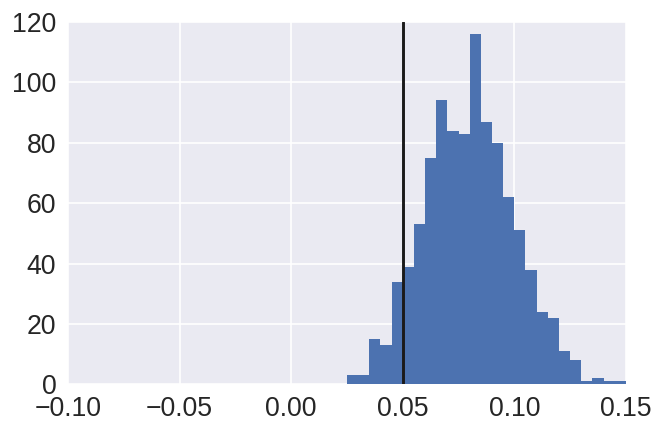

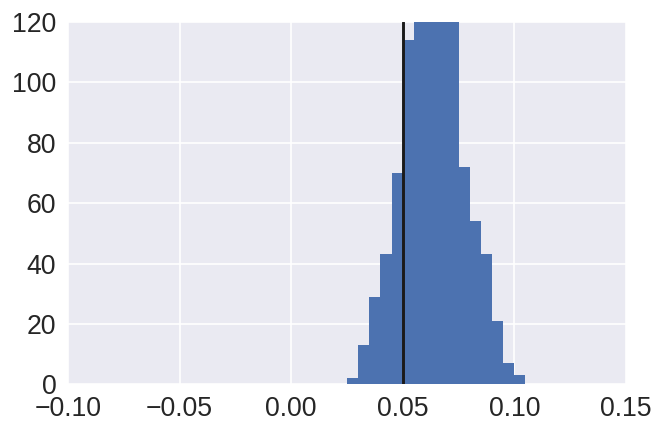

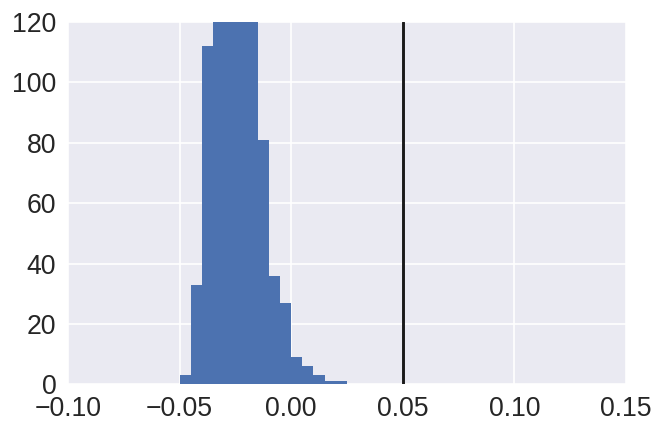

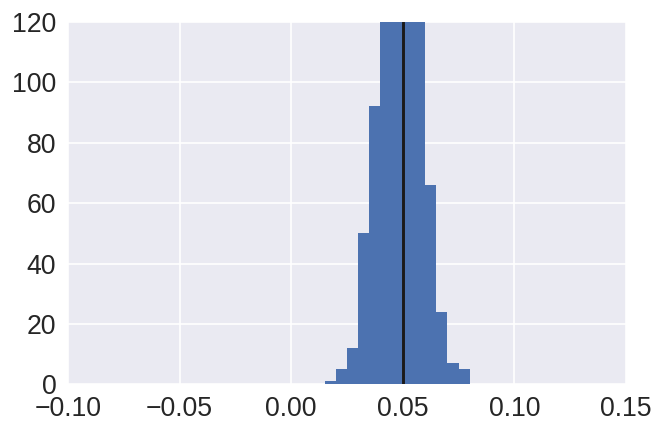

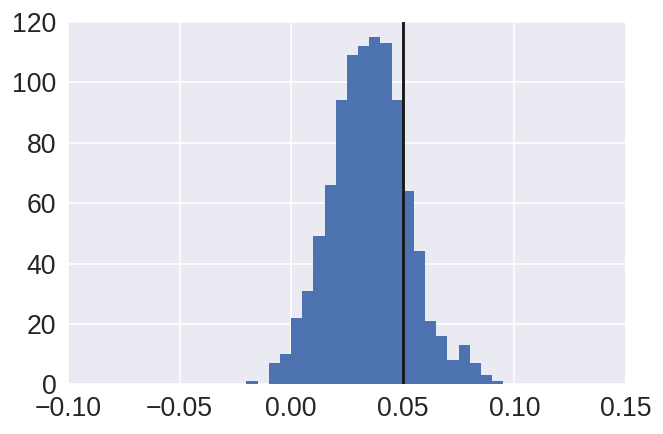

...

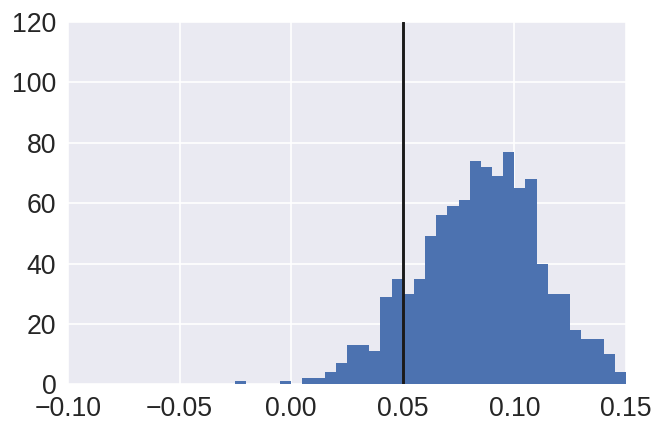

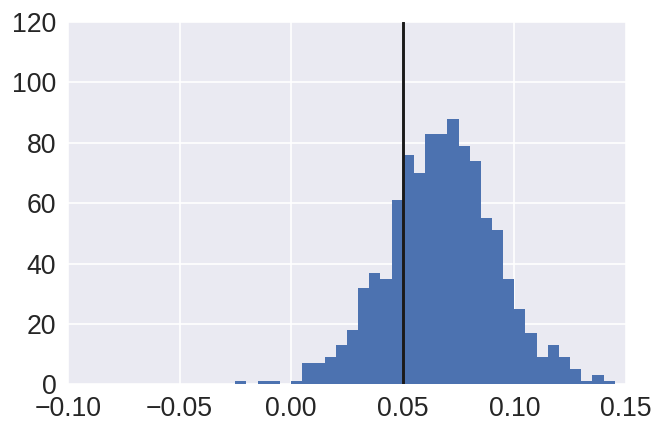

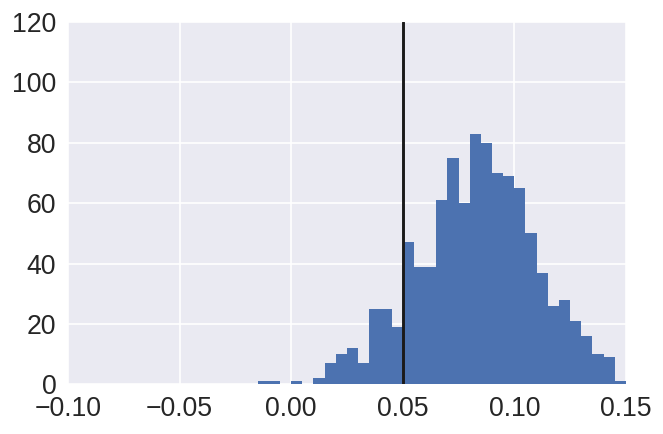

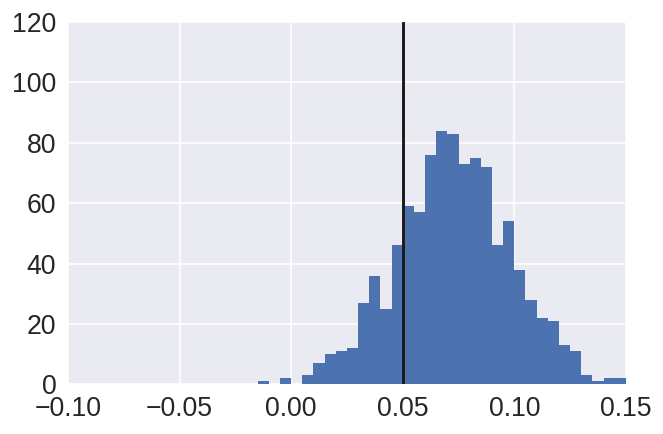

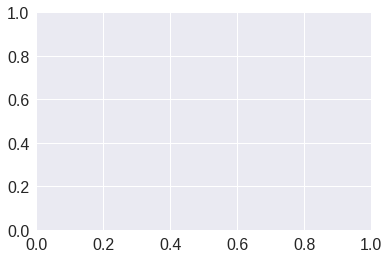

In [176]:
for prediction_elu in np.array(covnet_mo_elu_predictions)[:,3,:,0]:
    fig, l, image = predictions_hist(prediction_elu, mp.jumps_mu, 
                     "Convolutional Architecture - Multiple Output - ELU", 
                     "Jumps Mu",
                     min_edge = -0.1,
                     max_edge = 0.15,
                     y_lim = (0, 120),
                    img_subdir = "",
                     save_to_file = True);
    image_results.append(image)

In [177]:
print(len(image_results))

287


In [178]:
from moviepy.editor import ImageSequenceClip

In [179]:
clip = ImageSequenceClip(image_results, fps = 20)

AttributeError: 'Image' object has no attribute 'shape'

# Feedforward elu

In [43]:

input_1 = Input(batch_shape = (None, 60))

layer1 = Dense(2048, activation='elu')(input_1)
layer2 = Dense(1024, activation='elu')(layer1)

layer3 = Dense(512, activation='elu')(layer2)
layer4 = Dense(256, activation='elu')(layer3)

layer5 = Dense(128, activation='elu')(layer4)
layer6 = Dense(64, activation='elu')(layer5)

layer7 = Dense(32, activation='elu')(layer5)
last_layer = Dense(16, activation='elu')(layer7)

output1 = Dense(1, name="sigma")(last_layer)
output2 = Dense(1, name="mu")(last_layer)
output3 = Dense(1, name="jump_sigma")(last_layer)
output4 = Dense(1, name="jump_mu")(last_layer)
output5 = Dense(1, name="lambda")(last_layer)

In [44]:

feedforward = Model(input = input_1, output=[output1, output2, output3, output4, output5])

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=[<tf.Tenso...)`
  


In [46]:
feedforward.load_weights(H5_DIR_FULLYCONNECTED_MULTIPLE_ELU)

# Ensembling Network

In [13]:
ff_ensembling = Sequential()
ff_ensembling.add(Dense(128, input_dim = 8, activation='relu'))
ff_ensembling.add(Dense(256, activation='relu'))
ff_ensembling.add(Dense(128, activation='relu'))
ff_ensembling.add(Dense(64, activation='relu'))
ff_ensembling.add(Dense(32, activation='relu'))
ff_ensembling.add(Dense(5))

ff_ensembling.compile('adam', 'mean_squared_error', metrics=['mean_absolute_percentage_error', r2])

In [47]:
all_time = 2000
paramset_size = 1
paths_p_paramset = 1

RETURNS_ = []
PARAMS_ = []
        
for i in range(paramset_size):
    mp = random_model_params()
    mp.all_time = all_time
            
    for j in range(paths_p_paramset):
        PARAMS_.append([mp.all_sigma, mp.gbm_mu, mp.jumps_sigma, mp.jumps_mu, mp.lamda])
        RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
                
predictions = []
for return_set in train_data:
    output1 = covnet_mo.predict(np.array([return_set]))
    output2 = covnet_lambda.predict(np.array([return_set]))
    output3 = covnet_jump_mu.predict(np.array([return_set]))
    output4 = covnet_jump_sigma.predict(np.array([return_set]))
    for output in output1:
        predictions.append(output[0][0])
    predictions.append(output2[0][0])
    predictions.append(output3[0][0])
    predictions.append(output4[0][0])
        
print(predictions)
        
print(PARAMS_)

AttributeError: 'builtin_function_or_method' object has no attribute 'uniform'

In [ ]:
def ensemble_batch_generator(all_time = 2000, paramset_size = 32, paths_p_paramset = 5):
    while True:
        RETURNS_ = []
        PARAMS_ = []
        
        for i in range(paramset_size):
            mp = random_model_params()
            mp.all_time = all_time
            
            for j in range(paths_p_paramset):
                PARAMS_.append([mp.all_sigma, mp.gbm_mu, mp.jumps_sigma, mp.jumps_mu, mp.lamda])
                RETURNS_.append(geometric_brownian_motion_jump_diffusion_log_returns(mp))
        
        train_data = np.reshape(np.array(RETURNS_), (paramset_size*paths_p_paramset, 40, 50, 1))
                
        predictionset = []
        for return_set in train_data:
            prediction = []
            output1 = covnet_mo.predict(np.array([return_set]))
            output2 = covnet_lambda.predict(np.array([return_set]))
            output3 = covnet_jump_mu.predict(np.array([return_set]))
            output4 = covnet_jump_sigma.predict(np.array([return_set]))
            for output in output1:
                prediction.append(output[0][0])
            prediction.append(output2[0][0])
            prediction.append(output3[0][0])
            prediction.append(output4[0][0])
            predictionset.append(prediction)
        
        
        yield np.array(predictionset), np.array(PARAMS_)

ensemble_batch_gen = ensemble_batch_generator(paramset_size=10, paths_p_paramset=5)

In [48]:
ff_ensembling.load_weights(H5_DIR_ENSEMBLING)

In [26]:


for i in range(150):
    ff_ensembling.fit_generator(ensemble_batch_gen, steps_per_epoch = 10, epochs = 1)
    ff_ensembling.save_weights(H5_DIR_ENSEMBLING)

Epoch 1/1
10/10 [==============================] - 12s - loss: 0.0702 - mean_absolute_percentage_error: 159.5318 - r2: 0.1603    
Epoch 1/1
10/10 [==============================] - 12s - loss: 0.0328 - mean_absolute_percentage_error: 411.3496 - r2: 0.6036    
Epoch 1/1
10/10 [==============================] - 13s - loss: 0.0150 - mean_absolute_percentage_error: 194.8047 - r2: 0.8024    
Epoch 1/1
10/10 [==============================] - 13s - loss: 0.0126 - mean_absolute_percentage_error: 189.8853 - r2: 0.8564    
Epoch 1/1
10/10 [==============================] - 13s - loss: 0.0066 - mean_absolute_percentage_error: 235.1893 - r2: 0.9176    
Epoch 1/1
10/10 [==============================] - 12s - loss: 0.0038 - mean_absolute_percentage_error: 199.7375 - r2: 0.9498    
Epoch 1/1
10/10 [==============================] - 12s - loss: 0.0032 - mean_absolute_percentage_error: 185.2724 - r2: 0.9597    
Epoch 1/1
10/10 [==============================] - 13s - loss: 0.0029 - mean_absolute_perc

KeyboardInterrupt: 

# Sensitivity Tests

### Sensitivity Test: Mu

In [13]:
mu_s = []
preds_MEAN = []
preds_Lower_16 = []
preds_Upper_84 = []


preds_SINGLE_LAMBDA_MEAN = []
preds_SINGLE_LAMBDA_Lower_16 = []
preds_SINGLE_LAMBDA_Upper_84 = []

In [14]:
for j in range(100):
    covnet_mo_elu = covnet_multiple_output_with_ELUs()
    covnet_mo_elu.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    #covnet_lambda = covnet_single_lambda()
    #covnet_lambda.load_weights(H5_DIR_COVNET_LAMBDA)
    
    mp.gbm_mu = -1 + float(j)/50
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_mo_elu.predict(test_set_pred)
    
    #predictions_lambda = covnet_lambda.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,       mu,      jump_sigma,   jump_mu,    lambda")
    print("    0.1         "+str(mp.gbm_mu)+"     0.07              0.05       0.02")
    
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    mu_s.append(mp.gbm_mu)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-Covnet_MO_Mu_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-Covnet_MO_Mu_preds_Lower_16.npy", preds_Lower_16)
    
np.save("Sensitivity_Test-Covnet_MO_Mu_mu_s.npy", mu_s)
np.save("Sensitivity_Test-Covnet_MO_Mu_preds_MEAN.npy", preds_MEAN)

#np.save("Sensitivity_Test-preds_VaryingMu_SINGLE_LAMBDA_MEAN.npy", preds_SINGLE_LAMBDA_MEAN)
#np.save("Sensitivity_Test-preds_VaryingMu_preds_SINGLE_LAMBDA_Lower_16", preds_SINGLE_LAMBDA_Lower_16)
#np.save("Sensitivity_Test-preds_VaryingMu_preds_SINGLE_LAMBDA_Upper_84", preds_SINGLE_LAMBDA_Upper_84)

0
GENERATION...
PREDICTION...

[[ 0.10536984 -0.98901141  0.08467516  0.07050917  0.01614664]]
   sigma,       mu,      jump_sigma,   jump_mu,    lambda
    0.1         -1.0     0.07              0.05       0.02
1
GENERATION...
PREDICTION...

[[ 0.10498731 -0.97242904  0.08410328  0.07166775  0.01630343]]
   sigma,       mu,      jump_sigma,   jump_mu,    lambda
    0.1         -0.98     0.07              0.05       0.02
2
GENERATION...
PREDICTION...

[[ 0.10521182 -0.95428222  0.08309185  0.0711037   0.0163149 ]]
   sigma,       mu,      jump_sigma,   jump_mu,    lambda
    0.1         -0.96     0.07              0.05       0.02
3
GENERATION...
PREDICTION...

[[ 0.10487745 -0.93714893  0.08365124  0.07070851  0.01627615]]
   sigma,       mu,      jump_sigma,   jump_mu,    lambda
    0.1         -0.94     0.07              0.05       0.02
4
GENERATION...
PREDICTION...

[[ 0.10479535 -0.91810942  0.08465959  0.07000932  0.01626477]]
   sigma,       mu,      jump_sigma,   jump_mu,    lam

In [56]:
preds_Upper_84 = np.load("Sensitivity_Test-Covnet_MO_Mu_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-Covnet_MO_Mu_preds_Lower_16.npy")
    
mu_s = np.load("Sensitivity_Test-Covnet_MO_Mu_mu_s.npy")
preds_MEAN = np.load("Sensitivity_Test-Covnet_MO_Mu_preds_MEAN.npy")

In [57]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigma_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigma_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

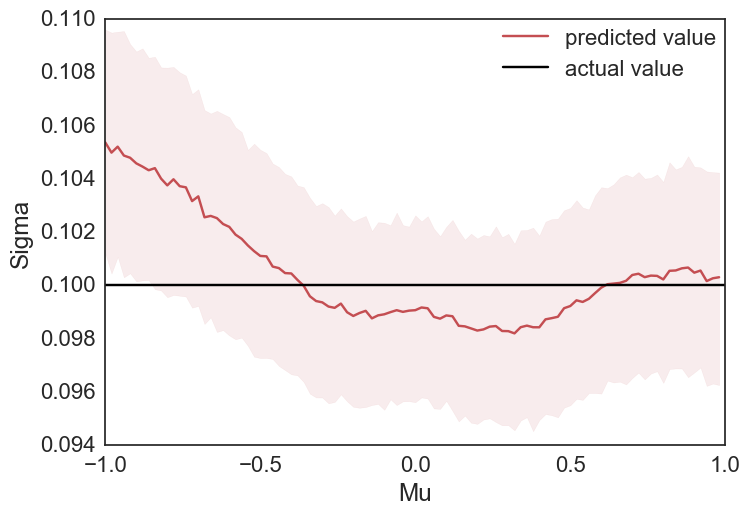

In [58]:
fig = pylab.figure()
sns.set_style("white")
pylab.plot(mu_s, sigmas, color='r', label="predicted value");
pylab.axhline(y=0.1, color='black', linestyle='-', label="actual value")
pylab.fill_between(mu_s, sigma_lower_16, sigma_upper_84, color='r', alpha=0.1, edgecolor='none')
pylab.xlabel("Mu")
pylab.ylabel("Sigma")

pylab.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Mu/"+"sigma.png")

In [59]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

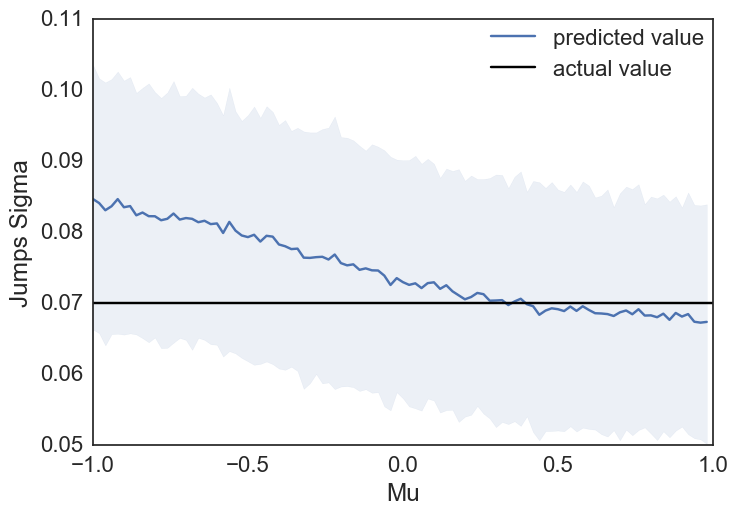

In [60]:
fig = pylab.figure()
pylab.plot(mu_s, jump_sigmas, color='b', label="predicted value");
pylab.axhline(y=0.07, color='black', linestyle='-', label="actual value")
pylab.fill_between(mu_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
pylab.xlabel("Mu")
pylab.ylabel("Jumps Sigma")

pylab.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Mu/"+"Jumps_Sigma.png")

In [61]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

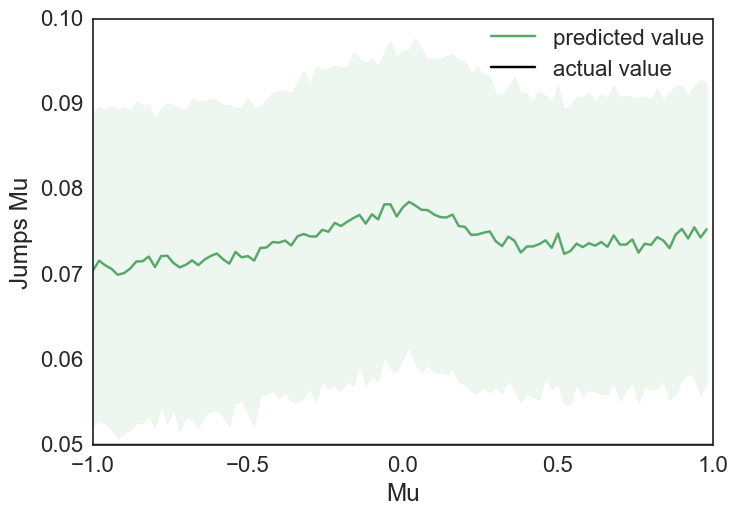

In [62]:
fig = pylab.figure()
pylab.plot(mu_s, jump_mus, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(mu_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Mu")
pylab.ylabel("Jumps Mu")

pylab.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Mu/"+"Jumps_Mu.png")

In [63]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

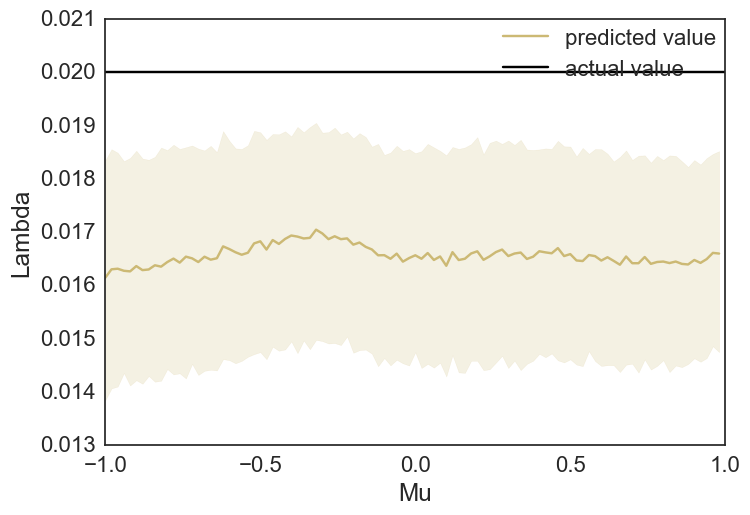

In [64]:
fig = pylab.figure()
pylab.plot(mu_s, lambdas, color='y', label="predicted value");
pylab.axhline(y=0.02, color='black', linestyle='-', label="actual value")
pylab.fill_between(mu_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
pylab.xlabel("Mu")
pylab.ylabel("Lambda")

pylab.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Mu/"+"Lambda.png")

In [65]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

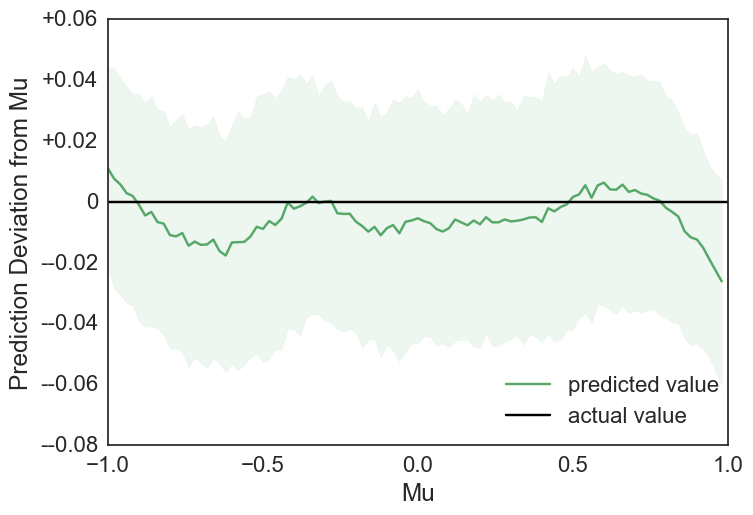

In [96]:
fig = pylab.figure()
pylab.plot(mu_s, mus_-mu_s, color='g', label="predicted value");
#pylab.plot(0, mu_s, color='black', alpha = 0.5, label="actual value");
pylab.axhline(y=0, color='black', linestyle='-', label="actual value")
pylab.fill_between(mu_s, mus_lower_16-mu_s, mus_upper_84-mu_s, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Mu")
pylab.ylabel("Prediction Deviation from Mu")
ax = pylab.gca()
vals = ax.get_yticks()
ax.set_yticklabels(['-'+str(x) for x in vals[vals<0]] + [0] + ['+'+str(x) for x in vals[vals>0]])

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Mu/"+"Mu.png")

# Sensitivity Test - Sigma

In [97]:
sigma_s = []
preds_MEAN = []
preds_Lower_16 = []
preds_Upper_84 = []

for j in range(100):
    covnet_mo_elu = covnet_multiple_output_with_ELUs()
    covnet_mo_elu.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.all_sigma = 0.001 + j*(0.2 - 0.001)/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    print("PREDICTION...\n")
    predictions_elu = covnet_mo_elu.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   "+str(mp.all_sigma)+"      0.05       0.07              0.05       0.02")
    print(np.mean(predictions_elu, axis = 1)+np.std(predictions_elu, axis = 1))
    print(np.percentile(predictions_elu, 84, axis = 1))
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    sigma_s.append(mp.all_sigma)
    
np.save("Sensitivity_Test-Covnet_MO_Sigma_sigma_s.npy", sigma_s)
np.save("Sensitivity_Test-Covnet_MO_Sigma_preds_MEAN.npy", preds_MEAN)
np.save("Sensitivity_Test-Covnet_MO_Sigma_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-Covnet_MO_Sigma_preds_Lower_16.npy", preds_Lower_16)

NameError: name 'covnet_multiple_output_with_ELUs' is not defined

In [98]:
sigma_s = np.load("Sensitivity_Test-Covnet_MO_Sigma_sigma_s.npy")
preds_MEAN = np.load("Sensitivity_Test-Covnet_MO_Sigma_preds_MEAN.npy")
preds_Upper_84 = np.load("Sensitivity_Test-Covnet_MO_Sigma_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-Covnet_MO_Sigma_preds_Lower_16.npy")

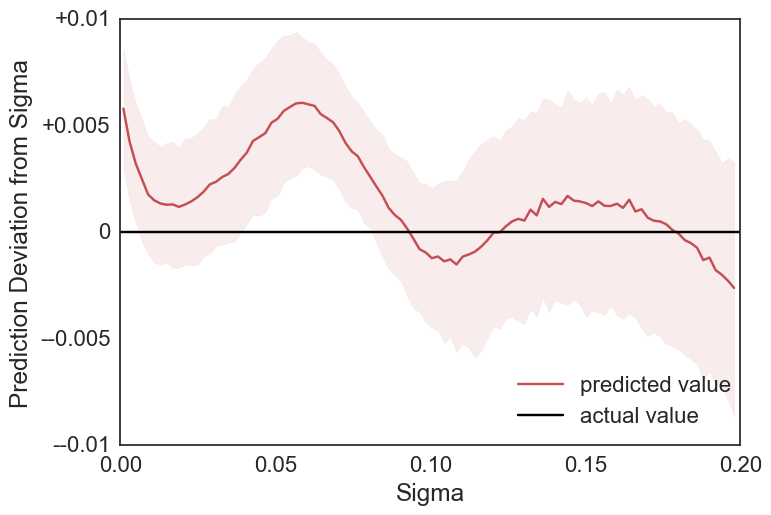

In [102]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigma_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigma_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

fig = pylab.figure()
pylab.plot(sigma_s, sigmas-sigma_s, color='r', label="predicted value");
#pylab.plot(sigma_s, sigma_s, color='black', label="actual value");
pylab.axhline(y=0, color='black', linestyle='-', label="actual value")
pylab.fill_between(sigma_s, sigma_lower_16-sigma_s, sigma_upper_84-sigma_s, color='r', alpha=0.1, edgecolor='none')
pylab.xlabel("Sigma")
pylab.ylabel("Prediction Deviation from Sigma")
ax = pylab.gca()
vals = ax.get_yticks()
ax.set_yticklabels(['-'+str(x) for x in vals[vals<0]] + [0] + ['+'+str(x) for x in vals[vals>0]])


pylab.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Sigma/"+"Sigma.png")

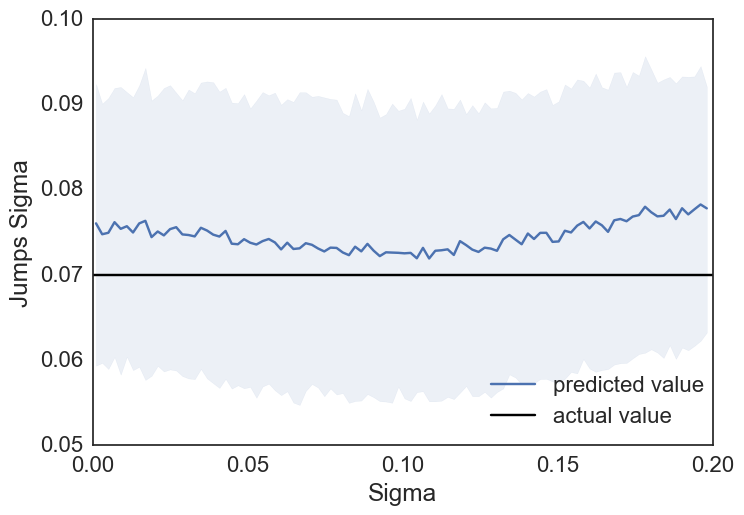

In [103]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

fig = pylab.figure()
pylab.plot(sigma_s, jump_sigmas, color='b', label="predicted value");
pylab.axhline(y=0.07, color='black', linestyle='-', label="actual value")
pylab.fill_between(sigma_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
pylab.xlabel("Sigma")
pylab.ylabel("Jumps Sigma")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Sigma/"+"Jumps_Sigma.png")

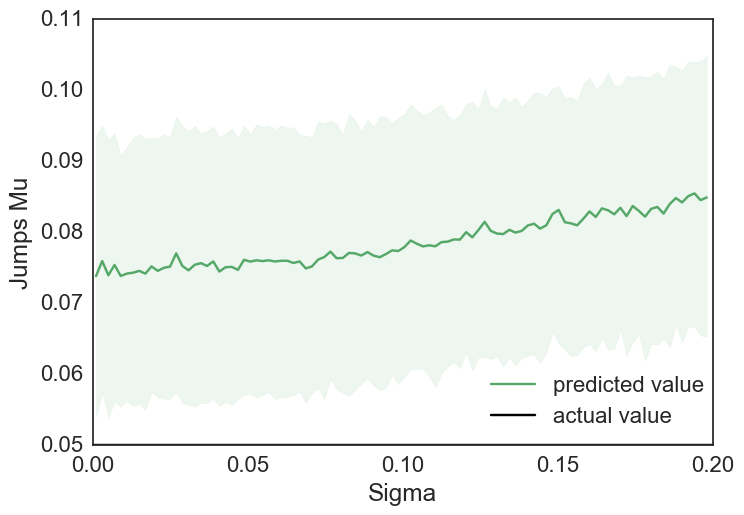

In [104]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

fig = pylab.figure()
pylab.plot(sigma_s, jump_mus, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(sigma_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Sigma")
pylab.ylabel("Jumps Mu")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Sigma/"+"Jumps_Mu.png")

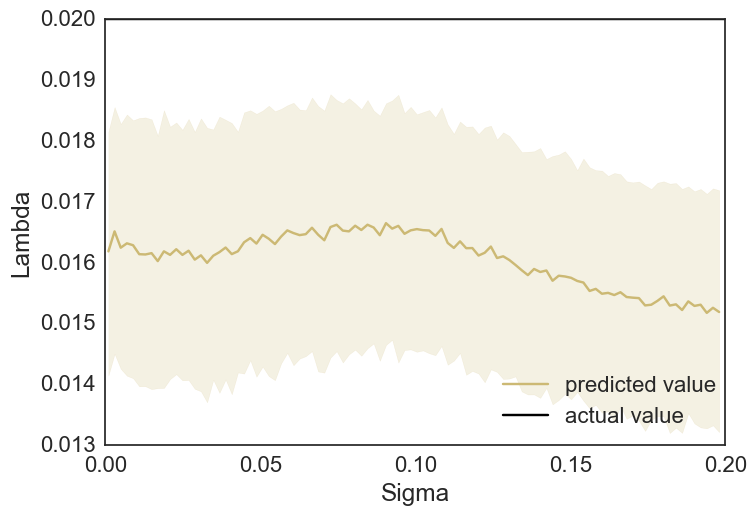

In [105]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

fig = pylab.figure()
pylab.plot(sigma_s, lambdas, color='y', label="predicted value");
pylab.axhline(y=0.02, color='black', linestyle='-', label="actual value")
pylab.fill_between(sigma_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
pylab.xlabel("Sigma")
pylab.ylabel("Lambda")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Sigma/"+"Lambda.png")

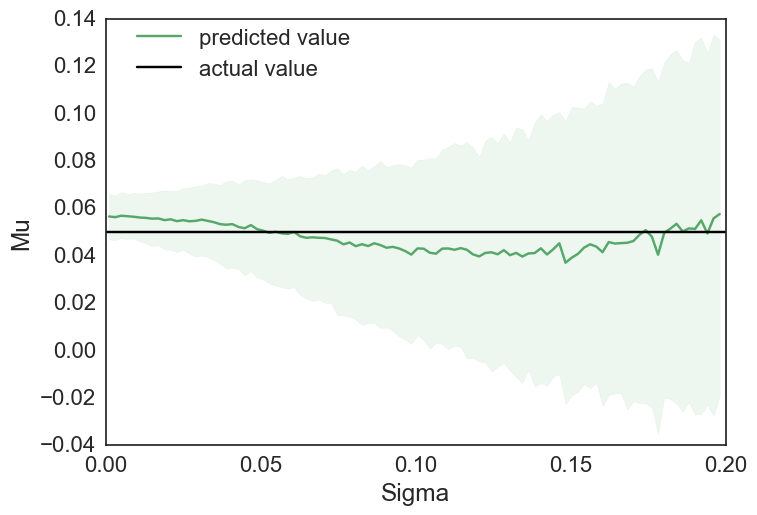

In [106]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

fig = pylab.figure()
pylab.plot(sigma_s, mus_, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(sigma_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Sigma")
pylab.ylabel("Mu")

pylab.legend(bbox_to_anchor=(0.4085, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Sigma/"+"Mu.png")

# Sensitivity Test - Jumps Sigma

In [107]:
jump_sigma_s = []
preds_MEAN = []
preds_Lower_16 = []
preds_Upper_84 = []

for j in range(100):
    covnet_mo_elu = covnet_multiple_output_with_ELUs()
    covnet_mo_elu.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.jumps_sigma = 0.001 + j*(0.2 - 0.001)/100
    test_set = []
    
    print(str(j) + " out of "+str(100))
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_mo_elu.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   0.1      0.05       "+str(mp.jumps_sigma)+"              0.05       0.02")
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    jump_sigma_s.append(mp.jumps_sigma)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-Covnet_MO_JumpSigma_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-Covnet_MO_JumpSigma_preds_Lower_16.npy", preds_Lower_16)
np.save("Sensitivity_Test-Covnet_MO_JumpSigma_jump_sigma_s.npy", jump_sigma_s)
np.save("Sensitivity_Test-Covnet_MO_JumpSigma_preds_MEAN.npy", preds_MEAN)

NameError: name 'covnet_multiple_output_with_ELUs' is not defined

In [108]:
preds_Upper_84 = np.load("Sensitivity_Test-Covnet_MO_JumpSigma_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-Covnet_MO_JumpSigma_preds_Lower_16.npy")
jump_sigma_s = np.load("Sensitivity_Test-Covnet_MO_JumpSigma_jump_sigma_s.npy")
preds_MEAN = np.load("Sensitivity_Test-Covnet_MO_JumpSigma_preds_MEAN.npy")

In [ ]:
def sensitivity_plot_w_true_value(x_values, predictions, true_value, upper_confidence_predictions, lower_confidence_predictions, 
                                  x_name, y_name, line_color = 'b', save_dir = None, legend_anchor = (1,1)):
    fig = pylab.figure()
    pylab.plot(x_values, predictions, color=line_color, label="predicted value");
    pylab.axhline(y=true_value, color='black', linestyle='-', label="actual value")
    pylab.fill_between(x_values, mus_lower_16, mus_upper_84, color=line_color, alpha=0.1, edgecolor='none')
    pylab.xlabel(x_name)
    pylab.ylabel(y_name)

    pylab.legend(bbox_to_anchor=legend_anchor, loc=1, borderaxespad=0.)
    if save_dir != None:
        fig.savefig(save_dir)
    
    return fig

In [ ]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)
save_dir = ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_sigma/"+"Mu.png"

sensitivity_plot_w_true_value(jump_sigma_s, mus_, test_set_model_params().jumps_sigma, mus_upper_84, mus_lower_16, 
                              "Jumps Mu", "Mu", line_color = 'g', save_dir = "./Mu.png")

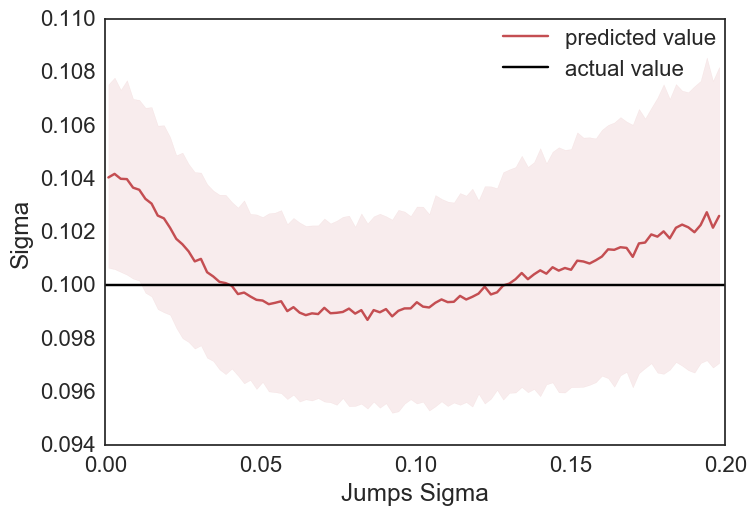

In [111]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigmas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigmas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

fig = pylab.figure()
pylab.plot(jump_sigma_s, sigmas, color='r', label="predicted value");
pylab.axhline(y=0.1, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_sigma_s, sigmas_lower_16, sigmas_upper_84, color='r', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Sigma")
pylab.ylabel("Sigma")

pylab.legend(bbox_to_anchor=(1, 1), loc=0, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_sigma/"+"Sigma.png")

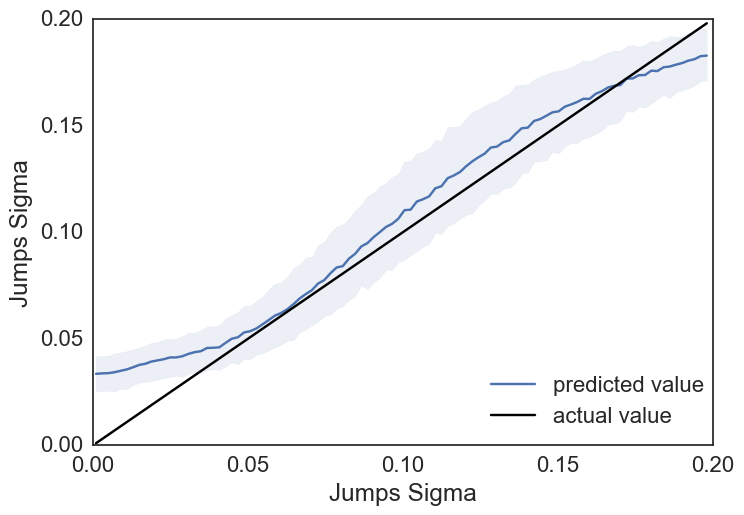

In [112]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

fig = pylab.figure()
pylab.plot(jump_sigma_s, jump_sigmas, color='b', label="predicted value");
pylab.plot(jump_sigma_s, jump_sigma_s, color='black', label="actual value");
pylab.fill_between(jump_sigma_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Sigma")
pylab.ylabel("Jumps Sigma")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_sigma/"+"Jumps_Sigma.png")

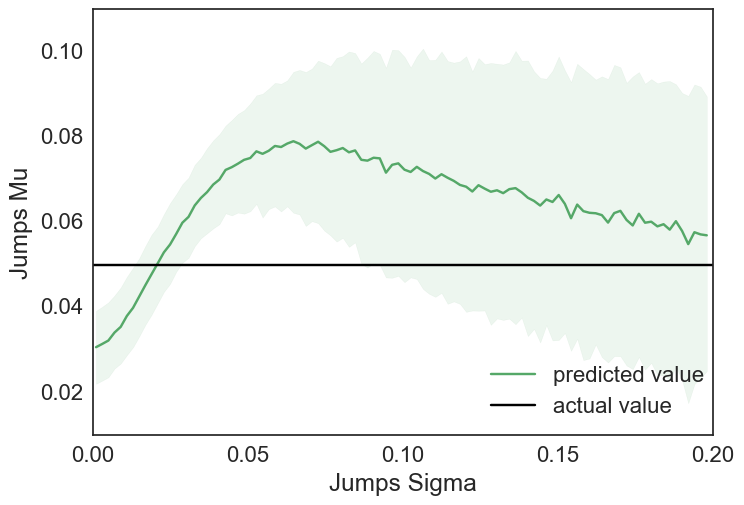

In [113]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

fig = pylab.figure()
pylab.plot(jump_sigma_s, jump_mus, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_sigma_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Sigma")
pylab.ylabel("Jumps Mu")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_sigma/"+"Jumps_Mu.png")

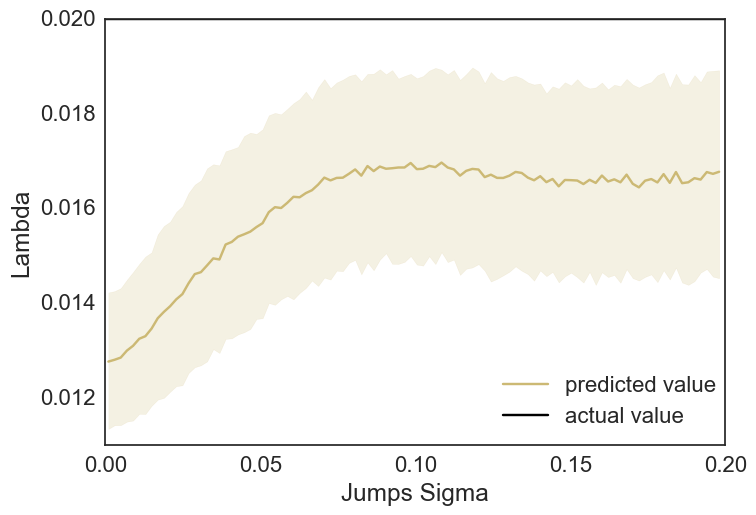

In [114]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

fig = pylab.figure()
pylab.plot(jump_sigma_s, lambdas, color='y', label="predicted value");
pylab.axhline(y=0.02, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_sigma_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
pylab.xlabel("Jumps Sigma")
pylab.ylabel("Lambda")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_sigma/"+"Lambda.png")

# Sensitivity Test - Jumps Mu

In [17]:
jump_mu_s = []
preds_MEAN = []
preds_Upper_84 = []
preds_Lower_16 = []

for j in range(100):
    covnet_mo_elu = covnet_multiple_output_with_ELUs()
    covnet_mo_elu.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.jumps_mu = -0.5 + j/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_mo_elu.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   0.1      0.05       0.07              "+str(mp.jumps_mu)+"       0.02")
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    jump_mu_s.append(mp.jumps_mu)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-Covnet_MO_JumpMu_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-Covnet_MO_JumpMu_preds_Lower_16.npy", preds_Lower_16)
    
np.save("Sensitivity_Test-Covnet_MO_JumpMu_jump_mu_s.npy", jump_mu_s)
np.save("Sensitivity_Test-Covnet_MO_JumpMu_preds_MEAN.npy", preds_MEAN)

0
GENERATION...
PREDICTION...

[[ 0.09415717  0.0217211   0.10640576 -0.48272899  0.01864377]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.5       0.02
1
GENERATION...
PREDICTION...

[[ 0.09432612  0.02213568  0.10422052 -0.47505498  0.01850742]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.49       0.02
2
GENERATION...
PREDICTION...

[[ 0.09516995  0.02178272  0.10276531 -0.4663873   0.0184858 ]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.48       0.02
3
GENERATION...
PREDICTION...

[[ 0.09545214  0.02336014  0.09926561 -0.45826158  0.018472  ]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.47       0.02
4
GENERATION...
PREDICTION...

[[ 0.09564953  0.02211424  0.09690157 -0.44979483  0.01844982]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0

In [242]:
preds_Upper_84 = np.load("Sensitivity_Test-Covnet_MO_JumpMu_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-Covnet_MO_JumpMu_preds_Lower_16.npy")
    
jump_mu_s = np.load("Sensitivity_Test-Covnet_MO_JumpMu_jump_mu_s.npy")
preds_MEAN = np.load("Sensitivity_Test-Covnet_MO_JumpMu_preds_MEAN.npy")

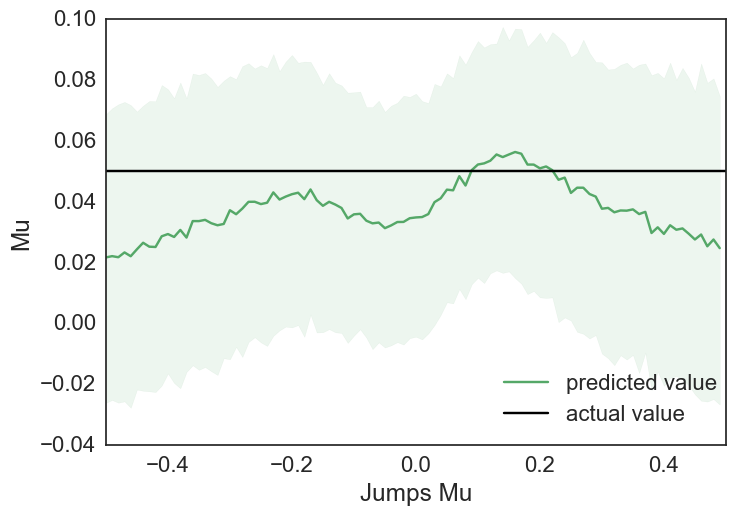

In [243]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

fig = pylab.figure()
pylab.plot(jump_mu_s, mus_, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_mu_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Mu")
pylab.ylabel("Mu")
pylab.xlim(-0.5, 0.5)

pylab.legend(bbox_to_anchor=(1, 0.19), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_mu/"+"Mu.png")

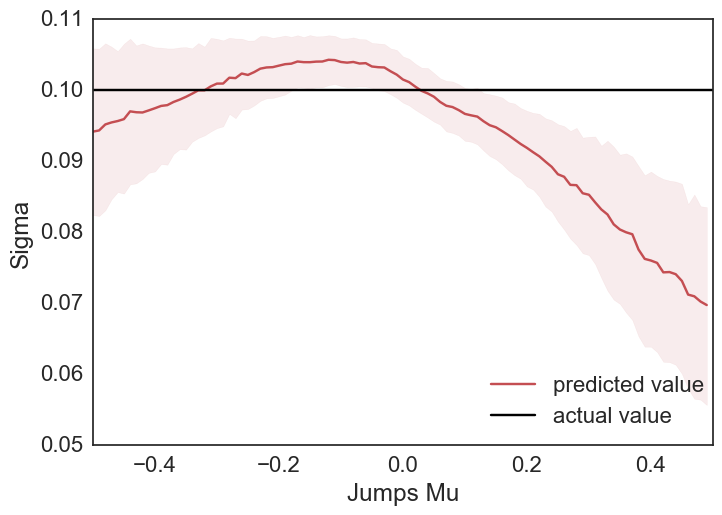

In [244]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigmas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigmas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

fig = pylab.figure()
pylab.plot(jump_mu_s, sigmas, color='r', label="predicted value");
pylab.axhline(y=0.1, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_mu_s, sigmas_lower_16, sigmas_upper_84, color='r', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Mu")
pylab.ylabel("Sigma")
pylab.xlim(-0.5, 0.5)

pylab.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_mu/"+"Sigma.png")

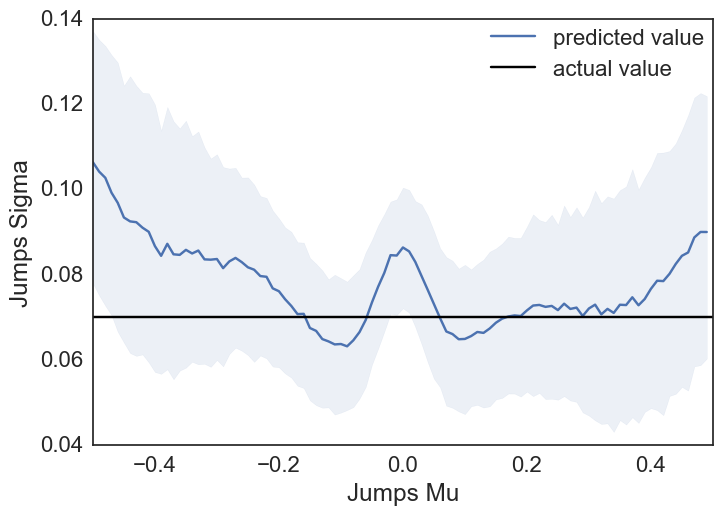

In [251]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

fig = pylab.figure()
pylab.plot(jump_mu_s, jump_sigmas, color='b', label="predicted value");
pylab.axhline(y=0.07, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_mu_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Mu")
pylab.ylabel("Jumps Sigma")
pylab.xlim(-0.5, 0.5)

pylab.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_mu/"+"Jumps_Sigma.png")

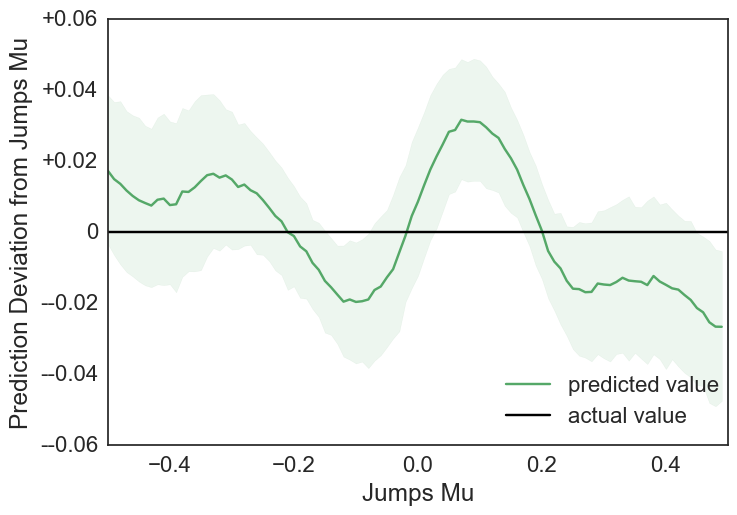

In [255]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

fig = pylab.figure()
pylab.plot(jump_mu_s, jump_mus-jump_mu_s, color='g', label="predicted value");
pylab.axhline(y=0, color='black', linestyle='-', label="actual value")

#pylab.plot(jump_mu_s, jump_mu_s, color='black', label="actual value");
pylab.fill_between(jump_mu_s, jump_mus_lower_16-jump_mu_s, jump_mus_upper_84-jump_mu_s, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Jumps Mu")
pylab.ylabel("Prediction Deviation from Jumps Mu")
pylab.xlim(-0.5, 0.5)
ax = pylab.gca()
vals = ax.get_yticks()
ax.set_yticklabels(['-'+str(x) for x in vals[vals<0]] + [0] + ['+'+str(x) for x in vals[vals>0]])


pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_mu/"+"Jumps_Mu.png")

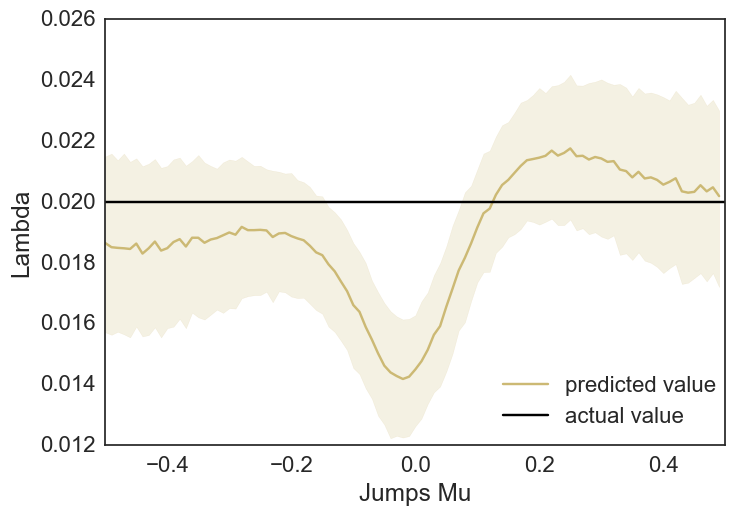

In [254]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

fig = pylab.figure()
pylab.plot(jump_mu_s, lambdas, color='y', label="predicted value");
pylab.axhline(y=0.02, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_mu_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
pylab.xlabel("Jumps Mu")
pylab.ylabel("Lambda")
pylab.xlim(-0.5, 0.5)

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Jumps_mu/"+"Lambda.png")

# Sensitivity Test - Lambda

In [121]:
jump_lambda_s = []
preds_MEAN = []
preds_Upper_84 = []
preds_Lower_16 = []

for j in range(100):
    covnet_mo_elu = covnet_multiple_output_with_ELUs()
    covnet_mo_elu.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.lamda = 0.0001 + j*(0.025 - 0.0001)/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_mo_elu.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   0.1      0.05       0.07              0.05       "+str(mp.lamda))
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    jump_lambda_s.append(mp.lamda)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-Covnet_MO_Lambda_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-Covnet_MO_Lambda_preds_Lower_16.npy", preds_Lower_16)
    
np.save("Sensitivity_Test-Covnet_MO_Lambda_jump_lambda_s.npy", jump_lambda_s)
np.save("Sensitivity_Test-Covnet_MO_Lambda_preds_MEAN.npy", preds_MEAN)

NameError: name 'covnet_multiple_output_with_ELUs' is not defined

In [231]:
preds_Upper_84 = np.load("Sensitivity_Test-Covnet_MO_Lambda_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-Covnet_MO_Lambda_preds_Lower_16.npy")
    
jump_lambda_s = np.load("Sensitivity_Test-Covnet_MO_Lambda_jump_lambda_s.npy")
preds_MEAN = np.load("Sensitivity_Test-Covnet_MO_Lambda_preds_MEAN.npy")

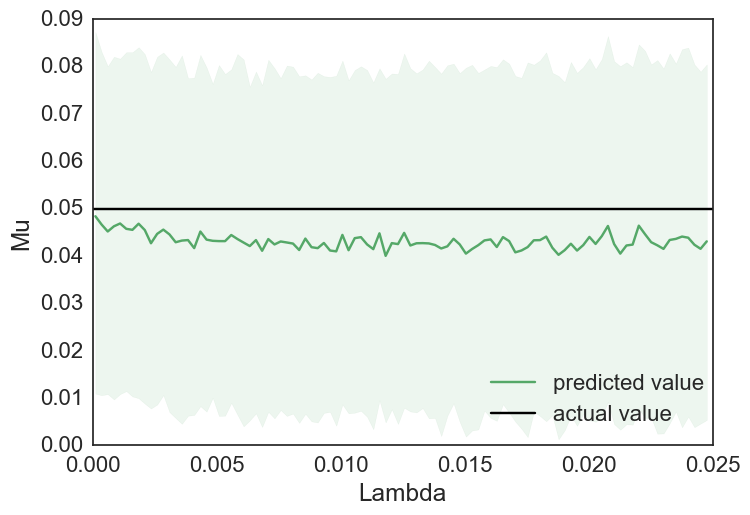

In [232]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

fig = pylab.figure()
pylab.plot(jump_lambda_s, mus_, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_lambda_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Lambda")
pylab.ylabel("Mu")

pylab.legend(bbox_to_anchor=(1, 0.19), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Lambda/"+"Mu.png")

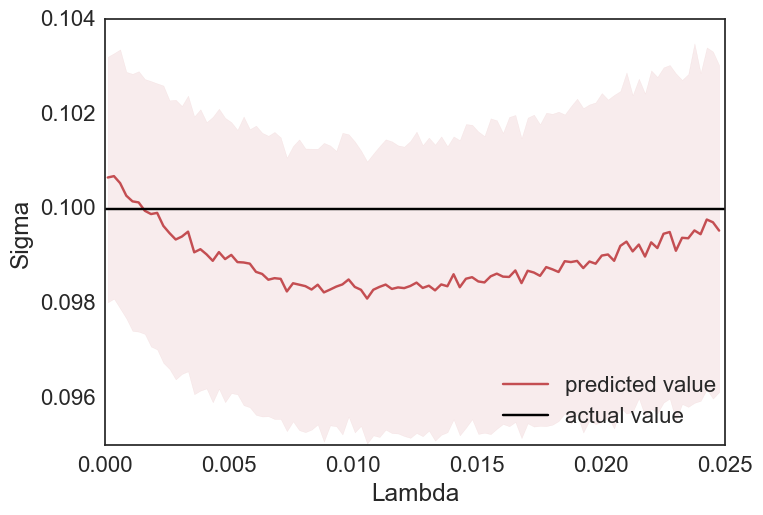

In [233]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigmas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigmas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

fig = pylab.figure()
pylab.plot(jump_lambda_s, sigmas, color='r', label="predicted value");
pylab.axhline(y=0.1, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_lambda_s, sigmas_lower_16, sigmas_upper_84, color='r', alpha=0.1, edgecolor='none')
pylab.xlabel("Lambda")
pylab.ylabel("Sigma")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Lambda/"+"Sigma.png")

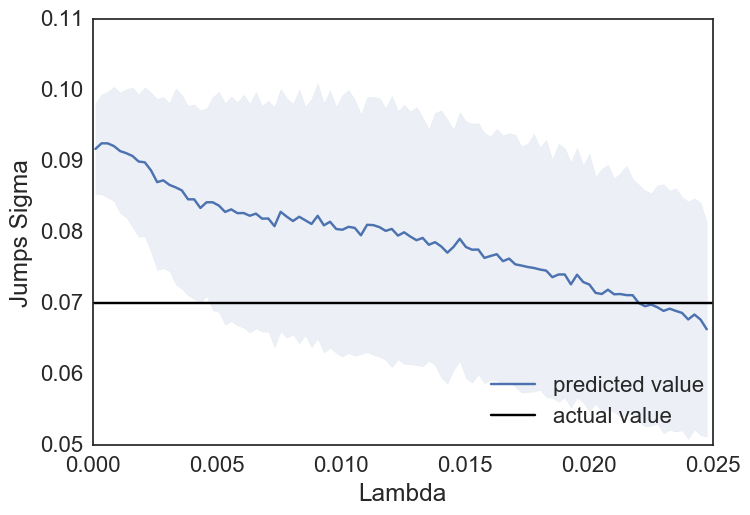

In [234]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

fig = pylab.figure()
pylab.plot(jump_lambda_s, jump_sigmas, color='b', label="predicted value");
pylab.axhline(y=0.07, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_lambda_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
pylab.xlabel("Lambda")
pylab.ylabel("Jumps Sigma")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Lambda/"+"Jumps_Sigma.png")

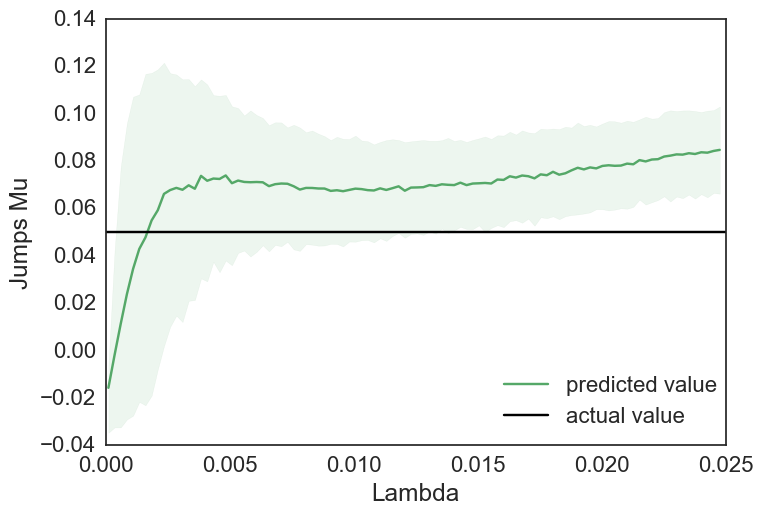

In [235]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

fig = pylab.figure()
pylab.plot(jump_lambda_s, jump_mus, color='g', label="predicted value");
pylab.axhline(y=0.05, color='black', linestyle='-', label="actual value")
pylab.fill_between(jump_lambda_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
pylab.xlabel("Lambda")
pylab.ylabel("Jumps Mu")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Lambda/"+"Jumps_Mu.png")

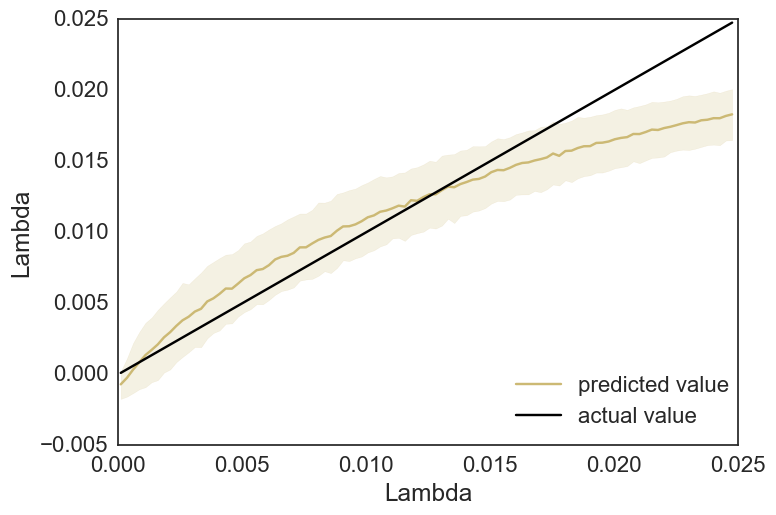

In [236]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

fig = pylab.figure()
pylab.plot(jump_lambda_s, lambdas, color='y', label="predicted value");
pylab.plot(jump_lambda_s, jump_lambda_s, color='black', label="actual value");
pylab.fill_between(jump_lambda_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
pylab.xlabel("Lambda")
pylab.ylabel("Lambda")

pylab.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Lambda/"+"Lambda.png")

# Sensitivity Tests

### Sensitivity Test: Mu

In [9]:
mu_s = []
preds_MEAN = []
preds_Lower_16 = []
preds_Upper_84 = []


preds_SINGLE_LAMBDA_MEAN = []
preds_SINGLE_LAMBDA_Lower_16 = []
preds_SINGLE_LAMBDA_Upper_84 = []

In [114]:
for j in range(100):
    covnet_lambda = covnet_single_lambda()
    covnet_lambda.load_weights(H5_DIR_COVNET_LAMBDA)
    
    mp.gbm_mu = -1 + float(j)/50
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_lambda.predict(test_set_pred)
    
    #predictions_lambda = covnet_lambda.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,       mu,      jump_sigma,   jump_mu,    lambda")
    print("    0.1         "+str(mp.gbm_mu)+"     0.07              0.05       0.02")
    
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    mu_s.append(mp.gbm_mu)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-covnet_lambda_Mu_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-covnet_lambda_Mu_preds_Lower_16.npy", preds_Lower_16)
    
np.save("Sensitivity_Test-covnet_lambda_Mu_mu_s.npy", mu_s)
np.save("Sensitivity_Test-covnet_lambda_Mu_preds_MEAN.npy", preds_MEAN)

#np.save("Sensitivity_Test-preds_VaryingMu_SINGLE_LAMBDA_MEAN.npy", preds_SINGLE_LAMBDA_MEAN)
#np.save("Sensitivity_Test-preds_VaryingMu_preds_SINGLE_LAMBDA_Lower_16", preds_SINGLE_LAMBDA_Lower_16)
#np.save("Sensitivity_Test-preds_VaryingMu_preds_SINGLE_LAMBDA_Upper_84", preds_SINGLE_LAMBDA_Upper_84)

0
GENERATION...
PREDICTION...

[ 0.01754661  0.01784924  0.01871164  0.01891058  0.01571202  0.01957616
  0.01074898  0.01605196  0.01105653  0.01797794  0.01376552  0.02022464
  0.01724299  0.01908035  0.01536711  0.01642754  0.01857954  0.01823498
  0.01900009  0.0182963   0.01773622  0.01875482  0.01774264  0.01209288
  0.01952403  0.01593576  0.02028734  0.01955714  0.01432226  0.01677413
  0.01570648  0.01507534  0.01349549  0.01608123  0.01678906  0.01981927
  0.01659255  0.01621397  0.01756001  0.01847914  0.0156244   0.01877657
  0.0168824   0.01864089  0.01674567  0.01427705  0.01613233  0.01773305
  0.01797152  0.01439759  0.01896533  0.01317926  0.01807237  0.01317923
  0.0189188   0.01726009  0.01341879  0.01949709  0.01819688  0.01905346
  0.01471167  0.01765349  0.01782473  0.01620186  0.01590053  0.01824025
  0.0160784   0.01711079  0.01472796  0.01974814  0.01723874  0.01413528
  0.01613531  0.01586825  0.01103939  0.01613947  0.01389218  0.01479269
  0.0193118   0.0171

In [11]:
preds_Upper_84 = np.load("Sensitivity_Test-covnet_lambda_Mu_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-covnet_lambda_Mu_preds_Lower_16.npy")
    
mu_s = np.load("Sensitivity_Test-covnet_lambda_Mu_mu_s.npy")
preds_MEAN = np.load("Sensitivity_Test-covnet_lambda_Mu_preds_MEAN.npy")

In [12]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigma_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigma_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

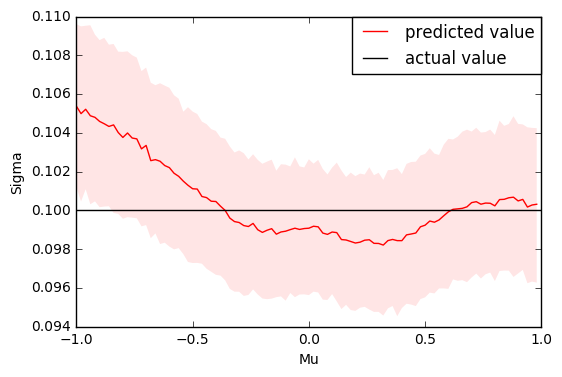

In [23]:
fig = pylab.figure()
pylab.plot(mu_s, sigmas, color='r', label="predicted value");
pylab.axhline(y=0.1, color='black', linestyle='-', label="actual value")
pylab.fill_between(mu_s, sigma_lower_16, sigma_upper_84, color='r', alpha=0.1, edgecolor='none')
pylab.xlabel("Mu")
pylab.ylabel("Sigma")

pylab.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
pylab.show();
fig.savefig(ROOT_DIR + "/Images/Output-Sensitivity-Results/ConvolutionalNN-MultipleOutput-ELU/Varying-Mu/"+"sigma.png")

In [24]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

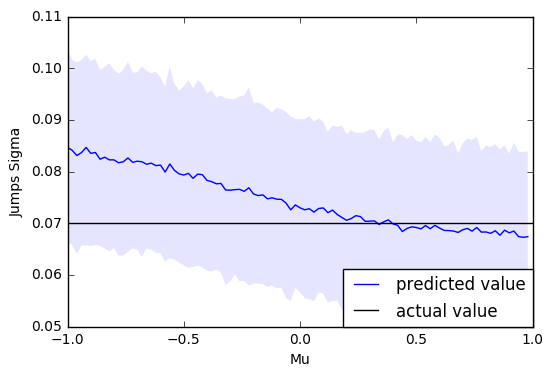

In [25]:
plt.plot(mu_s, jump_sigmas, color='b', label="predicted value");
plt.axhline(y=0.07, color='black', linestyle='-', label="actual value")
plt.fill_between(mu_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
plt.xlabel("Mu")
plt.ylabel("Jumps Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

In [26]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

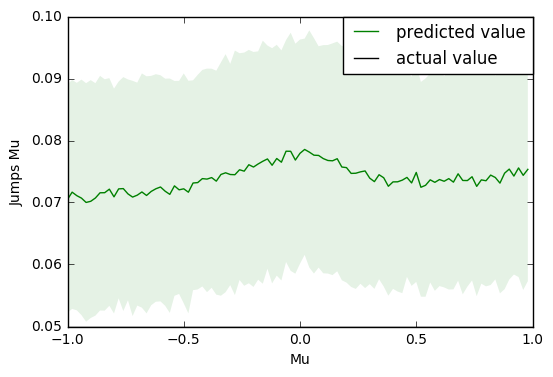

In [27]:
plt.plot(mu_s, jump_mus, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(mu_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Mu")
plt.ylabel("Jumps Mu")

plt.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
plt.show();

In [13]:
lambdas = np.array(preds_MEAN)[:,0].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

In [18]:
lambdas_upper_84

array([ 0.01754661,  0.01669089,  0.01857285,  0.01787472,  0.02103015,
        0.015892  ,  0.01702531,  0.01501149,  0.01794338,  0.01723587,
        0.01679795,  0.01307215,  0.01962003,  0.01996151,  0.01675334,
        0.01968351,  0.01987075,  0.01656457,  0.0213547 ,  0.01727264,
        0.01900436,  0.01578483,  0.02007651,  0.0190294 ,  0.01327763,
        0.01585456,  0.0190371 ,  0.01900444,  0.0178443 ,  0.01703867,
        0.02229458,  0.01946273,  0.01094383,  0.01662524,  0.02020444,
        0.01954542,  0.02059966,  0.01350605,  0.01423742,  0.01690061,
        0.01865434,  0.01466027,  0.01666975,  0.01599412,  0.01606164,
        0.01381274,  0.01691504,  0.01420132,  0.01333897,  0.01605906,
        0.01686763,  0.01459852,  0.01916202,  0.01666772,  0.01621027,
        0.01344183,  0.01682839,  0.0128664 ,  0.02058408,  0.01807947,
        0.0206252 ,  0.01814186,  0.01812607,  0.01933579,  0.0163747 ,
        0.01861138,  0.01306507,  0.01425768,  0.01806605,  0.01

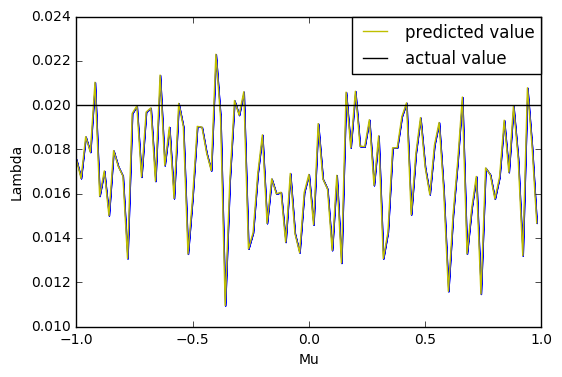

In [20]:
plt.plot(mu_s, lambdas, color='y', label="predicted value");
plt.axhline(y=0.02, color='black', linestyle='-', label="actual value")
plt.fill_between(mu_s, lambdas_lower_16, lambdas_upper_84, color='b', alpha=1, edgecolor='none')
plt.xlabel("Mu")
plt.ylabel("Lambda")

plt.legend(bbox_to_anchor=(1, 1), loc=1, borderaxespad=0.)
plt.show();

In [30]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

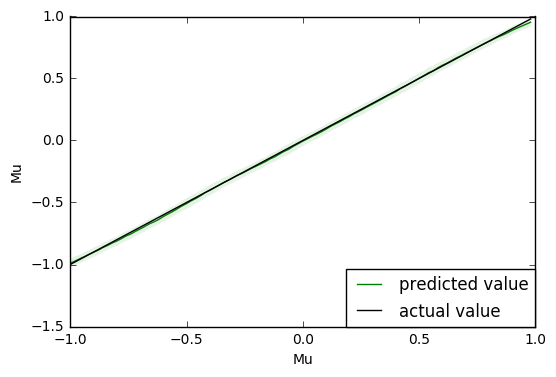

In [31]:
plt.plot(mu_s, mus_, color='g', label="predicted value");
plt.plot(mu_s, mu_s, color='black', label="actual value");
plt.fill_between(mu_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Mu")
plt.ylabel("Mu")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

# Sensitivity Test - Sigma

In [ ]:
sigma_s = []
preds_MEAN = []
preds_Lower_16 = []
preds_Upper_84 = []

for j in range(100):
    covnet_lambda = covnet_multiple_output_with_ELUs()
    covnet_lambda.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.all_sigma = 0.001 + j*(0.2 - 0.001)/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    print("PREDICTION...\n")
    predictions_elu = covnet_lambda.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   "+str(mp.all_sigma)+"      0.05       0.07              0.05       0.02")
    print(np.mean(predictions_elu, axis = 1)+np.std(predictions_elu, axis = 1))
    print(np.percentile(predictions_elu, 84, axis = 1))
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    sigma_s.append(mp.all_sigma)
    
np.save("Sensitivity_Test-covnet_lambda_Sigma_sigma_s.npy", sigma_s)
np.save("Sensitivity_Test-covnet_lambda_Sigma_preds_MEAN.npy", preds_MEAN)
np.save("Sensitivity_Test-covnet_lambda_Sigma_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-covnet_lambda_Sigma_preds_Lower_16.npy", preds_Lower_16)

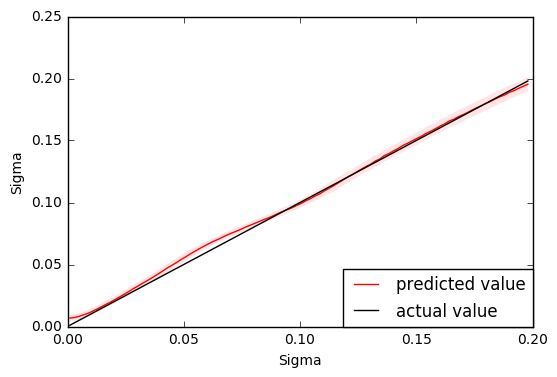

In [33]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigma_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigma_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

plt.plot(sigma_s, sigmas, color='r', label="predicted value");
plt.plot(sigma_s, sigma_s, color='black', label="actual value");
plt.fill_between(sigma_s, sigma_lower_16, sigma_upper_84, color='r', alpha=0.1, edgecolor='none')
plt.xlabel("Sigma")
plt.ylabel("Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
plt.show();

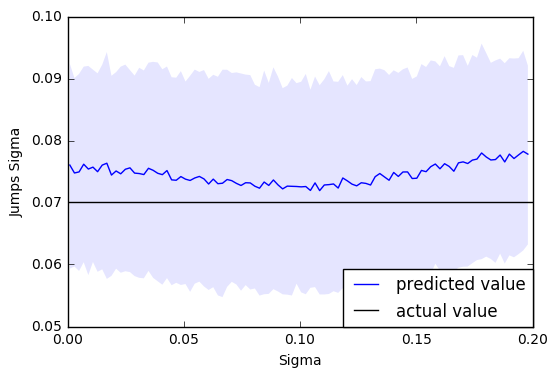

In [34]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

plt.plot(sigma_s, jump_sigmas, color='b', label="predicted value");
plt.axhline(y=0.07, color='black', linestyle='-', label="actual value")
plt.fill_between(sigma_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
plt.xlabel("Sigma")
plt.ylabel("Jumps Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

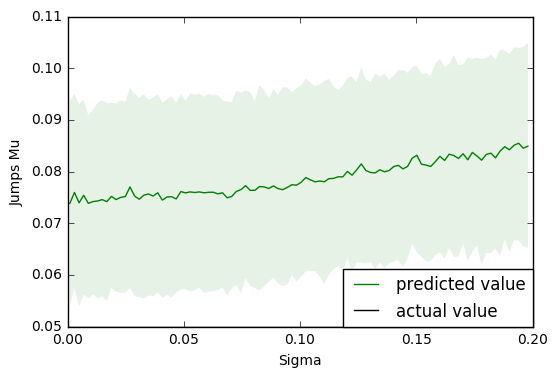

In [35]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

plt.plot(sigma_s, jump_mus, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(sigma_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Sigma")
plt.ylabel("Jumps Mu")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

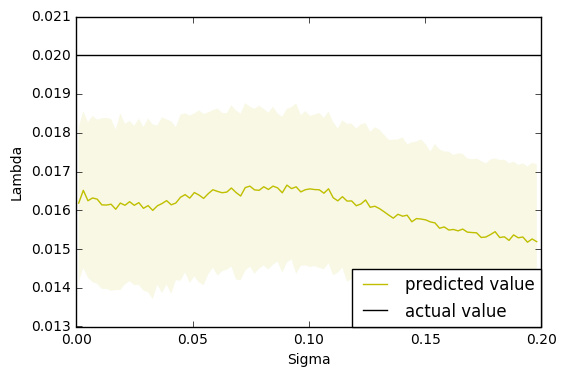

In [37]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

plt.plot(sigma_s, lambdas, color='y', label="predicted value");
plt.axhline(y=0.02, color='black', linestyle='-', label="actual value")
plt.fill_between(sigma_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.1, edgecolor='none')
plt.xlabel("Sigma")
plt.ylabel("Lambda")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

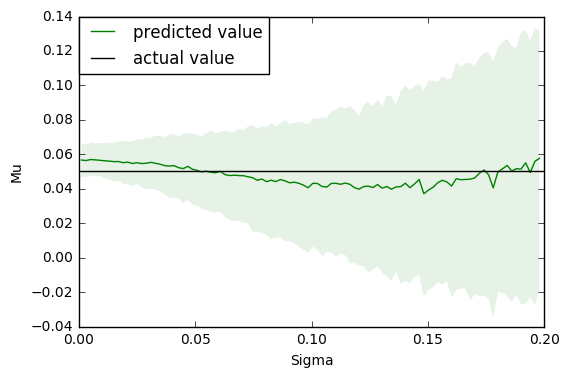

In [38]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

plt.plot(sigma_s, mus_, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(sigma_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Sigma")
plt.ylabel("Mu")

plt.legend(bbox_to_anchor=(0.4085, 1), loc=1, borderaxespad=0.)
plt.show();

# Sensitivity Test - Jumps Sigma

In [ ]:
jump_sigma_s = []
preds_MEAN = []
preds_Lower_16 = []
preds_Upper_84 = []

for j in range(100):
    covnet_lambda = covnet_multiple_output_with_ELUs()
    covnet_lambda.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.jumps_sigma = 0.001 + j*(0.2 - 0.001)/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_lambda.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   0.1      0.05       "+str(mp.jumps_sigma)+"              0.05       0.02")
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    jump_sigma_s.append(mp.jumps_sigma)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-covnet_lambda_JumpSigma_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-covnet_lambda_JumpSigma_preds_Lower_16.npy", preds_Lower_16)
np.save("Sensitivity_Test-covnet_lambda_JumpSigma_jump_sigma_s.npy", jump_sigma_s)
np.save("Sensitivity_Test-covnet_lambda_JumpSigma_preds_MEAN.npy", preds_MEAN)

KeyboardInterrupt: 

In [39]:
preds_Upper_84 = np.load("Sensitivity_Test-covnet_lambda_JumpSigma_preds_Upper_84.npy")
preds_Lower_16 = np.load("Sensitivity_Test-covnet_lambda_JumpSigma_preds_Lower_16.npy")
jump_sigma_s = np.load("Sensitivity_Test-covnet_lambda_JumpSigma_jump_sigma_s.npy")
preds_MEAN = np.load("Sensitivity_Test-covnet_lambda_JumpSigma_preds_MEAN.npy")

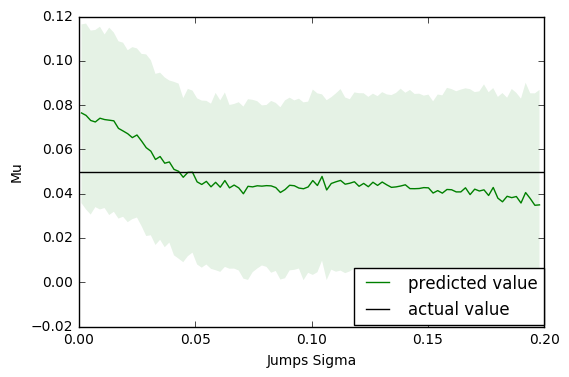

In [40]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

plt.plot(jump_sigma_s, mus_, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_sigma_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Sigma")
plt.ylabel("Mu")

plt.legend(bbox_to_anchor=(1, 0.19), loc=1, borderaxespad=0.)
plt.show();

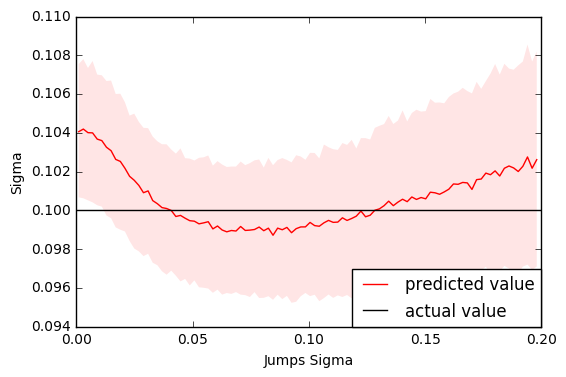

In [41]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigmas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigmas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

plt.plot(jump_sigma_s, sigmas, color='r', label="predicted value");
plt.axhline(y=0.1, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_sigma_s, sigmas_lower_16, sigmas_upper_84, color='r', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Sigma")
plt.ylabel("Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
plt.show();

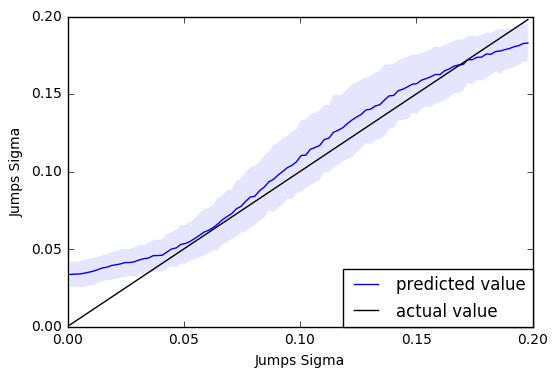

In [42]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

plt.plot(jump_sigma_s, jump_sigmas, color='b', label="predicted value");
plt.plot(jump_sigma_s, jump_sigma_s, color='black', label="actual value");
plt.fill_between(jump_sigma_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Sigma")
plt.ylabel("Jumps Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

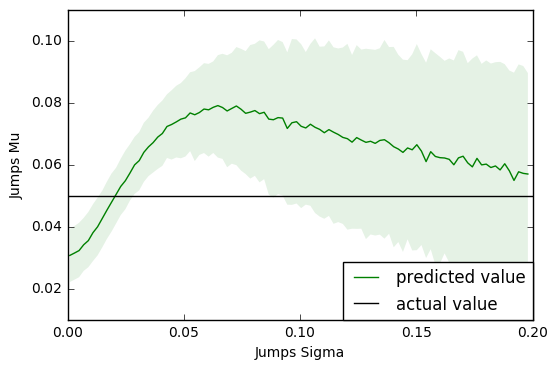

In [43]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

plt.plot(jump_sigma_s, jump_mus, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_sigma_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Sigma")
plt.ylabel("Jumps Mu")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

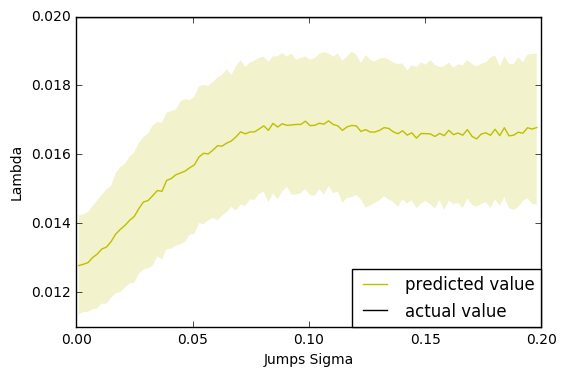

In [44]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

plt.plot(jump_sigma_s, lambdas, color='y', label="predicted value");
plt.axhline(y=0.02, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_sigma_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
plt.xlabel("Jumps Sigma")
plt.ylabel("Lambda")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

# Sensitivity Test - Jumps Mu

In [115]:
jump_mu_s = []
preds_MEAN = []
preds_Upper_84 = []
preds_Lower_16 = []

for j in range(100):
    covnet_lambda = covnet_multiple_output_with_ELUs()
    covnet_lambda.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.jumps_mu = -0.5 + j/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_lambda.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   0.1      0.05       0.07              "+str(mp.jumps_mu)+"       0.02")
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    jump_mu_s.append(mp.jumps_mu)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-covnet_lambda_JumpMu_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-covnet_lambda_JumpMu_preds_Lower_16.npy", preds_Lower_16)
    
np.save("Sensitivity_Test-covnet_lambda_JumpMu_jump_mu_s.npy", jump_mu_s)
np.save("Sensitivity_Test-covnet_lambda_JumpMu_preds_MEAN.npy", preds_MEAN)

0
GENERATION...
PREDICTION...

[[ 0.09358801  0.02716708  0.10604782 -0.48250023  0.01862055]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.5       0.02
1
GENERATION...
PREDICTION...

[[ 0.09472806  0.02322231  0.10443371 -0.47442847  0.01849458]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.49       0.02
2
GENERATION...
PREDICTION...

[[ 0.09470364  0.02547242  0.10327458 -0.46566382  0.0184239 ]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.48       0.02
3
GENERATION...
PREDICTION...

[[ 0.09509647  0.02195476  0.09701471 -0.45873681  0.01851395]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0.1      0.05       0.07              -0.47       0.02
4
GENERATION...
PREDICTION...

[[ 0.09548972  0.02388027  0.09710168 -0.4484601   0.01838682]]
   sigma,    mu,      jump_sigma,      jump_mu,    lambda
   0

KeyboardInterrupt: 

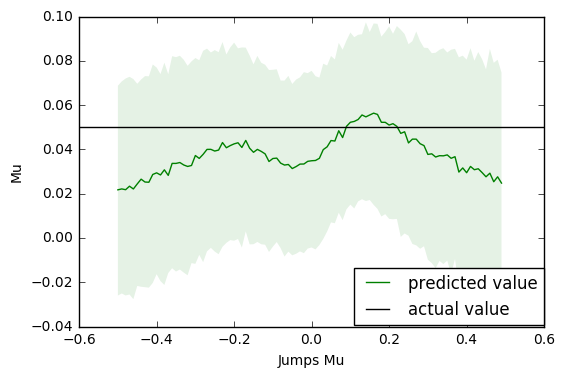

In [46]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

plt.plot(jump_mu_s, mus_, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_mu_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Mu")
plt.ylabel("Mu")

plt.legend(bbox_to_anchor=(1, 0.19), loc=1, borderaxespad=0.)
plt.show();

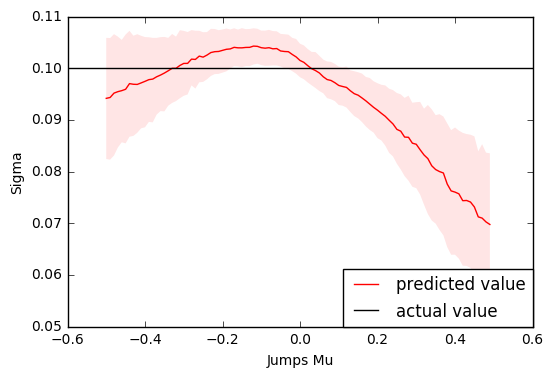

In [47]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigmas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigmas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

plt.plot(jump_mu_s, sigmas, color='r', label="predicted value");
plt.axhline(y=0.1, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_mu_s, sigmas_lower_16, sigmas_upper_84, color='r', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Mu")
plt.ylabel("Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
plt.show();

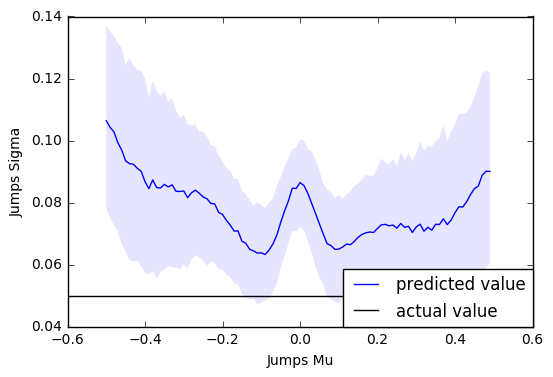

In [48]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

plt.plot(jump_mu_s, jump_sigmas, color='b', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_mu_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Mu")
plt.ylabel("Jumps Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

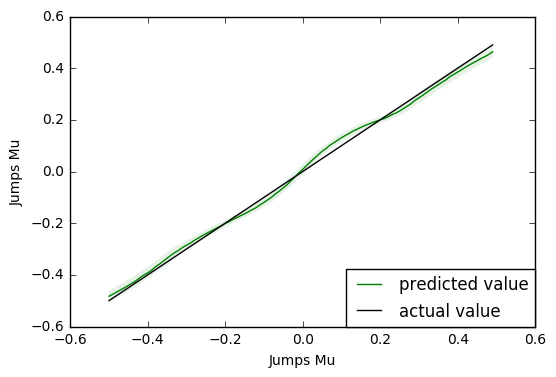

In [49]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

plt.plot(jump_mu_s, jump_mus, color='g', label="predicted value");
plt.plot(jump_mu_s, jump_mu_s, color='black', label="actual value");
plt.fill_between(jump_mu_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Jumps Mu")
plt.ylabel("Jumps Mu")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

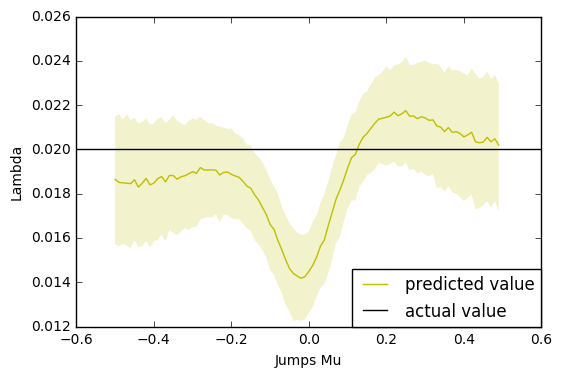

In [51]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

plt.plot(jump_mu_s, lambdas, color='y', label="predicted value");
plt.axhline(y=0.02, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_mu_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
plt.xlabel("Jumps Mu")
plt.ylabel("Lambda")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

# Sensitivity Test - Lambda

In [116]:
jump_lambda_s = []
preds_MEAN = []
preds_Upper_84 = []
preds_Lower_16 = []

for j in range(100):
    covnet_lambda = covnet_multiple_output_with_ELUs()
    covnet_lambda.load_weights(H5_DIR_COVNET_MULTIPLE_ELU)
    
    mp.lamda = 0.0001 + j*(0.025 - 0.0001)/100
    test_set = []
    
    print(j)
    
    print("GENERATION...")
    test_set_pred = standard_convolutional_test_set()
    
    
    print("PREDICTION...\n")
    predictions_elu = covnet_lambda.predict(test_set_pred)
    
    print(np.transpose(np.mean(predictions_elu, axis = 1)))
    print("   sigma,    mu,      jump_sigma,      jump_mu,    lambda")
    print("   0.1      0.05       0.07              0.05       "+str(mp.lamda))
    preds_MEAN.append(np.mean(predictions_elu, axis = 1))
    jump_lambda_s.append(mp.lamda)
    preds_Upper_84.append(np.percentile(predictions_elu, 84, axis = 1))
    preds_Lower_16.append(np.percentile(predictions_elu, 16, axis = 1))
    
np.save("Sensitivity_Test-covnet_lambda_Lambda_preds_Upper_84.npy", preds_Upper_84)
np.save("Sensitivity_Test-covnet_lambda_Lambda_preds_Lower_16.npy", preds_Lower_16)
    
np.save("Sensitivity_Test-covnet_lambda_Lambda_jump_lambda_s.npy", jump_lambda_s)
np.save("Sensitivity_Test-covnet_lambda_Lambda_preds_MEAN.npy", preds_MEAN)

KeyboardInterrupt: 

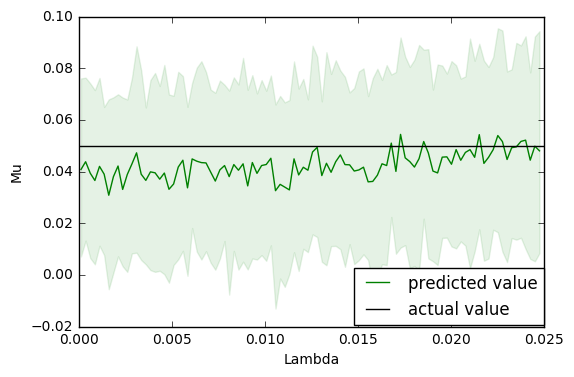

In [17]:
mus_ = np.array(preds_MEAN)[:,1].reshape(100)
mus_upper_84 = np.array(preds_Upper_84)[:,1].reshape(100)
mus_lower_16 = np.array(preds_Lower_16)[:,1].reshape(100)

plt.plot(jump_lambda_s, mus_, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_lambda_s, mus_lower_16, mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Lambda")
plt.ylabel("Mu")

plt.legend(bbox_to_anchor=(1, 0.19), loc=1, borderaxespad=0.)
plt.show();

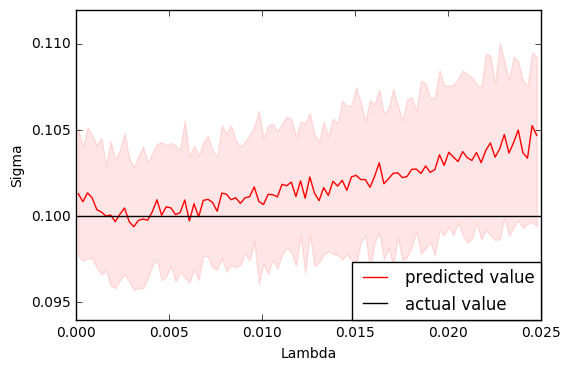

In [18]:
sigmas = np.array(preds_MEAN)[:,0].reshape(100)
sigmas_upper_84 = np.array(preds_Upper_84)[:,0].reshape(100)
sigmas_lower_16 = np.array(preds_Lower_16)[:,0].reshape(100)

plt.plot(jump_lambda_s, sigmas, color='r', label="predicted value");
plt.axhline(y=0.1, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_lambda_s, sigmas_lower_16, sigmas_upper_84, color='r', alpha=0.1, edgecolor='none')
plt.xlabel("Lambda")
plt.ylabel("Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=0, borderaxespad=0.)
plt.show();

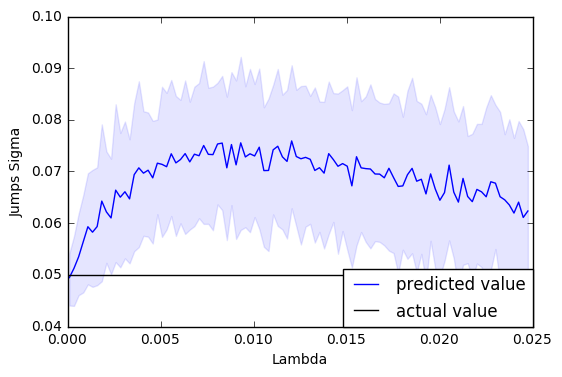

In [19]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)

plt.plot(jump_lambda_s, jump_sigmas, color='b', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_lambda_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
plt.xlabel("Lambda")
plt.ylabel("Jumps Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

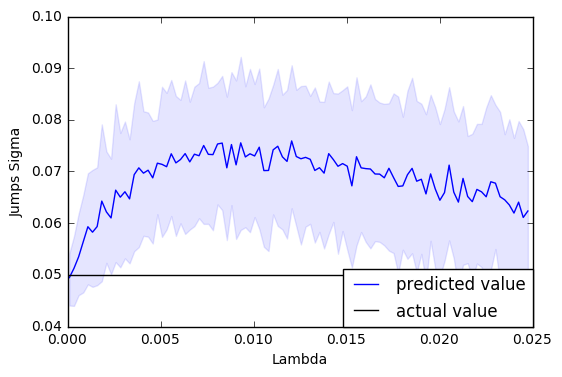

In [19]:
jump_sigmas = np.array(preds_MEAN)[:,2].reshape(100)
jump_sigmas_upper_84 = np.array(preds_Upper_84)[:,2].reshape(100)
jump_sigmas_lower_16 = np.array(preds_Lower_16)[:,2].reshape(100)


plt.plot(jump_lambda_s, jump_sigmas, color='b', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_lambda_s, jump_sigmas_lower_16, jump_sigmas_upper_84, color='b', alpha=0.1, edgecolor='none')
plt.xlabel("Lambda")
plt.ylabel("Jumps Sigma")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

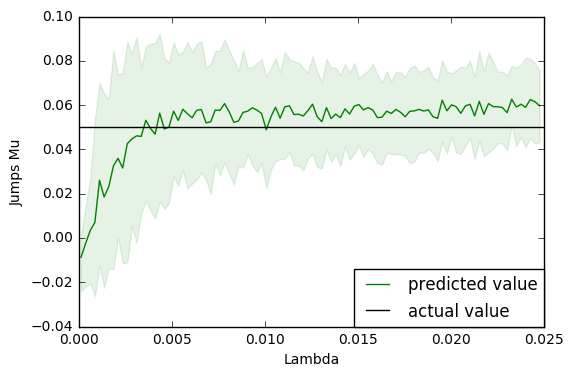

In [20]:
jump_mus = np.array(preds_MEAN)[:,3].reshape(100)
jump_mus_upper_84 = np.array(preds_Upper_84)[:,3].reshape(100)
jump_mus_lower_16 = np.array(preds_Lower_16)[:,3].reshape(100)

plt.plot(jump_lambda_s, jump_mus, color='g', label="predicted value");
plt.axhline(y=0.05, color='black', linestyle='-', label="actual value")
plt.fill_between(jump_lambda_s, jump_mus_lower_16, jump_mus_upper_84, color='g', alpha=0.1, edgecolor='none')
plt.xlabel("Lambda")
plt.ylabel("Jumps Mu")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

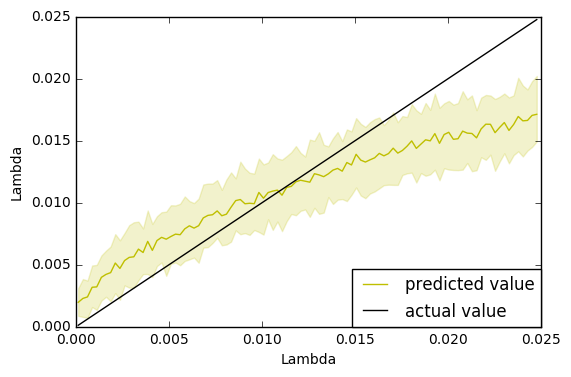

In [23]:
lambdas = np.array(preds_MEAN)[:,4].reshape(100)
lambdas_upper_84 = np.array(preds_Upper_84)[:,4].reshape(100)
lambdas_lower_16 = np.array(preds_Lower_16)[:,4].reshape(100)

plt.plot(jump_lambda_s, lambdas, color='y', label="predicted value");
plt.plot(jump_lambda_s, jump_lambda_s, color='black', label="actual value");
plt.fill_between(jump_lambda_s, lambdas_lower_16, lambdas_upper_84, color='y', alpha=0.2, edgecolor='none')
plt.xlabel("Lambda")
plt.ylabel("Lambda")

plt.legend(bbox_to_anchor=(1, 0.185), loc=1, borderaxespad=0.)
plt.show();

# Tests

In [26]:
test_set_pred = standard_convolutional_test_set()

0
100
200
300
400
500
600
700
800
900


NameError: name 'covnet_mo' is not defined

In [39]:
predictions = covnet_mo.predict(test_set_pred)
predictions_elu = covnet_mo_elu.predict(test_set_pred)

In [40]:
train_moments = [np.append(stats.moment(example, moment = range(2,20)), np.mean(example)) for example in test_set]

train_statistics = np.array([np.append(train_moments[i], 
                              sm.tsa.stattools.acf(test_set[i])) 
                    for i in range(len(test_set))])

In [47]:
predictions_ff = feedforward.predict(train_statistics)

In [48]:
np.mean(predictions, axis = 1)

array([[-0.00087139],
       [ 0.0013293 ],
       [-0.00073439],
       [ 0.00108923],
       [ 0.00148981]], dtype=float32)

In [49]:
np.mean(predictions_elu, axis = 1)

array([[ 0.10602916],
       [ 0.06622007],
       [ 0.06903592],
       [ 0.0600768 ],
       [ 0.01215505]], dtype=float32)

In [50]:
sigmas = predictions[0]

In [51]:
from PIL import Image

In [55]:
def predictions_hist(predictions, true_value, plot_title = "model", param_name = "param", min_edge = None, max_edge = None, y_lim = (None, None), bin_size = 0.0025, img_subdir = "/Images/", save_to_file = True):
    
    if min_edge == None:
        min_edge = np.min(predictions)
    
    if max_edge == None:
        max_edge = np.max(predictions)
    
    bin_size = (max_edge-min_edge)/50
    N = (max_edge-min_edge)/bin_size; Nplus1 = N + 1
    bin_list = np.linspace(min_edge, max_edge, Nplus1)

    fig = pylab.figure();
    l = pylab.hist(predictions, bins=bin_list);
    #pylab.title(plot_title);
    pylab.axvline(x = true_value, c='k');
    pylab.xlim(min_edge, max_edge);
    
    if y_lim != (None, None):
        pylab.ylim(y_lim[0], y_lim[1])
    
    fig.set_dpi(120)     # draw the canvas, cache the renderer
    
    def fig2data ( fig ):
        """
        @brief Convert a Matplotlib figure to a 4D numpy array with RGBA channels and return it
        @param fig a matplotlib figure
        @return a numpy 3D array of RGBA values
        """
        # draw the renderer
        fig.canvas.draw ( )

        # Get the RGBA buffer from the figure
        w,h = fig.canvas.get_width_height()
        buf = numpy.fromstring ( fig.canvas.tostring_argb(), dtype=numpy.uint8 )
        buf.shape = ( w, h,4 )

        # canvas.tostring_argb give pixmap in ARGB mode. Roll the ALPHA channel to have it in RGBA mode
        buf = numpy.roll ( buf, 3, axis = 2 )
        return buf

    def fig2img ( fig ):
        """
        @brief Convert a Matplotlib figure to a PIL Image in RGBA format and return it
        @param fig a matplotlib figure
        @return a Python Imaging Library ( PIL ) image
        """
        # put the figure pixmap into a numpy array
        buf = fig2data ( fig )
        w, h, d = buf.shape
        return Image.frombytes( "RGBA", ( w ,h ), buf.tostring( ) )
    
    #width, height = fig.get_size_inches() * fig.get_dpi()
    #img = (np.fromstring(fig.canvas.tostring_rgb(), dtype='uint8', sep='')).reshape(fig.canvas.get_width_height()[::-1] + (3,))
    
    if save_to_file:
        fig.savefig(ROOT_DIR + img_subdir + plot_title + "_" + param_name + ".png");
    return fig, l, fig2img(fig)

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  # This is added back by InteractiveShellApp.init_path()


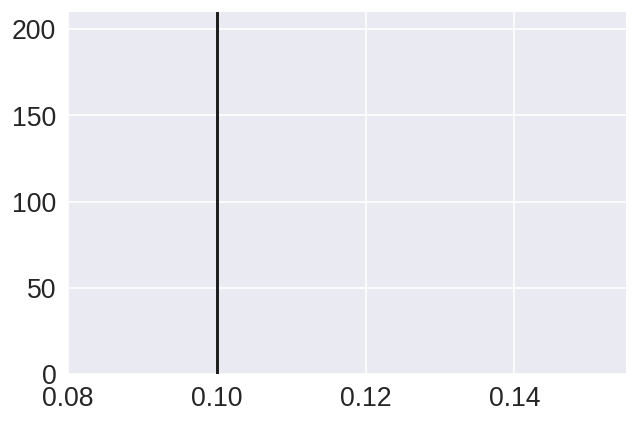

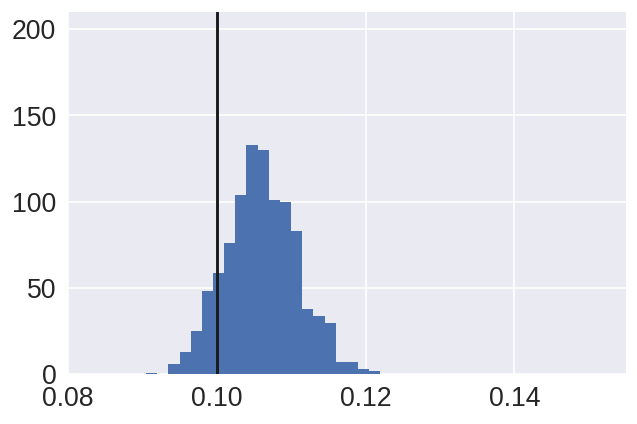

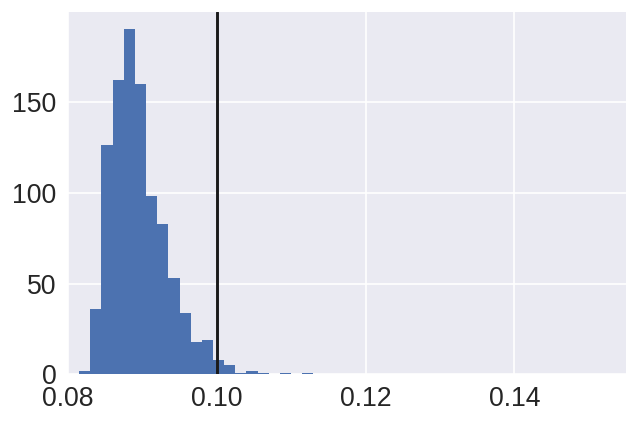

In [65]:
predictions_hist(predictions[0], mp.all_sigma, 
                 "Convolutional Architecture - Multiple Output - ReLU", 
                 "Sigma",
                 min_edge = 0.08,
                 max_edge = 0.155,
                 y_lim = (0, 210),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ReLU/");

predictions_hist(predictions_elu[0], mp.all_sigma, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Sigma",
                 min_edge = 0.08,
                 max_edge = 0.155,
                 y_lim = (0, 210),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ELU/");

predictions_hist(predictions_ff[0], mp.all_sigma, 
                 "Fully Connected Architecture - Multiple Output - ELU", 
                 "Sigma",
                 min_edge = 0.08,
                 max_edge = 0.155,
                 img_subdir = "/Images/Parameter-Prediction-Results/FullyConnected-MultipleOutput-ELU/");

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  # This is added back by InteractiveShellApp.init_path()


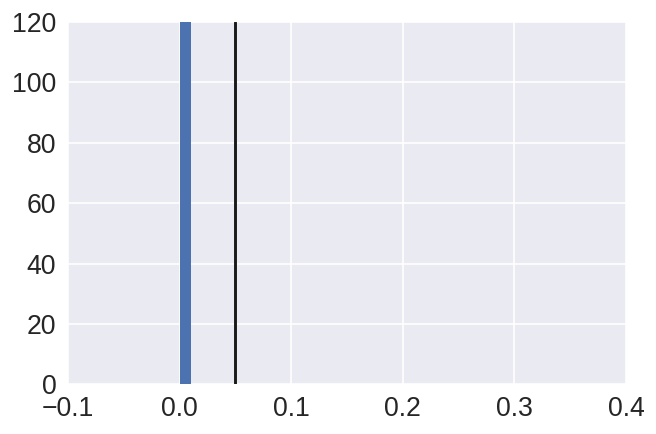

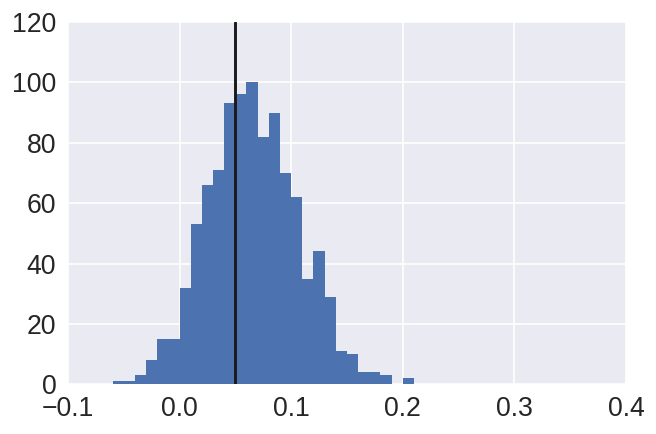

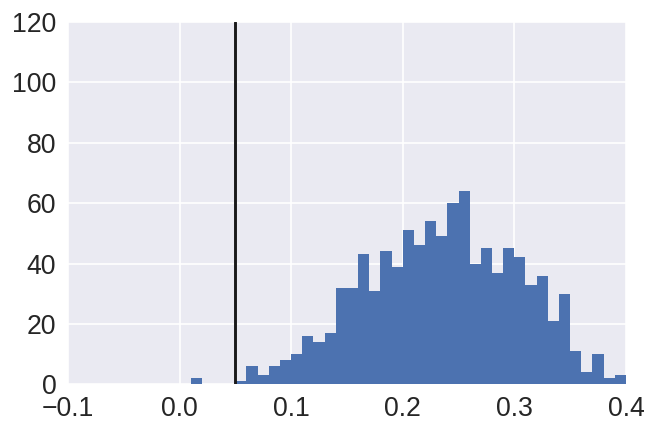

In [66]:
predictions_hist(predictions[1], mp.gbm_mu, 
                 "Convolutional Architecture - Multiple Output - ReLU", 
                 "Mu",
                 min_edge = -0.1,
                 max_edge = 0.4,
                 y_lim = (0, 120),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ReLU/");

predictions_hist(predictions_elu[1], mp.gbm_mu, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Mu",
                 min_edge = -0.1,
                 max_edge = 0.4,
                 y_lim = (0, 120),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ELU/");

predictions_hist(predictions_ff[1], mp.gbm_mu, 
                 "Fully Connected Architecture - Multiple Output - ELU", 
                 "Mu",
                 min_edge = -0.1,
                 max_edge = 0.4,
                 y_lim = (0, 120),
                 img_subdir = "/Images/Parameter-Prediction-Results/FullyConnected-MultipleOutput-ELU/");

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  # This is added back by InteractiveShellApp.init_path()


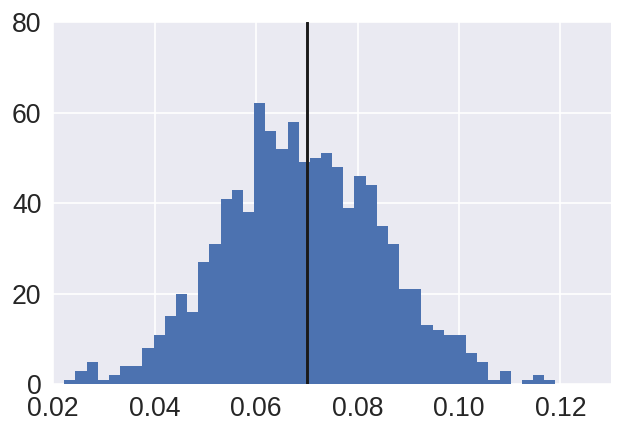

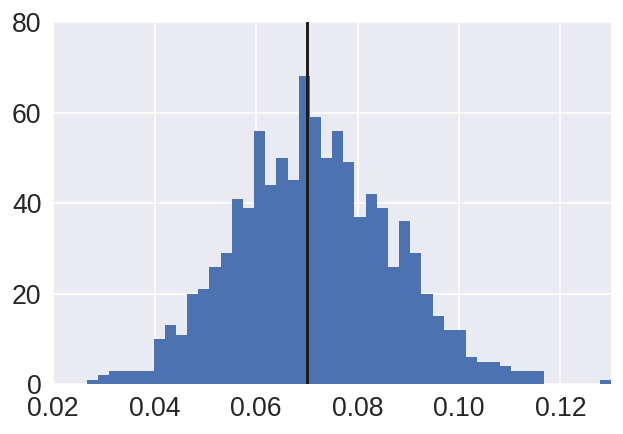

In [70]:
"""predictions_hist(predictions[2], mp.jumps_sigma, 
                 "Convolutional Architecture - Multiple Output - ReLU", 
                 "Jumps Sigma",
                 min_edge = 0.02,
                 max_edge = 0.13,
                 y_lim = (0, 80),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ReLU/");
"""
predictions_hist(predictions_elu[2], mp.jumps_sigma, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Jumps Sigma",
                 min_edge = 0.02,
                 max_edge = 0.13,
                 y_lim = (0, 80),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ELU/");

"""predictions_hist(predictions_ff[2], mp.jumps_sigma, 
                 "Fully Connected Architecture - Multiple Output - ELU", 
                 "Jumps Sigma",
                 min_edge = 0.02,
                 max_edge = 0.13,
                 img_subdir = "/Images/Parameter-Prediction-Results/FullyConnected-MultipleOutput-ELU/");"""

preds_so = covnet_jump_sigma.predict(test_set_pred)
predictions_hist(preds_so, mp.jumps_sigma, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Jumps Sigma",
                 min_edge = 0.02,
                 max_edge = 0.13,
                 y_lim = (0, 80),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ELU/");

/home/gerhard/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  # This is added back by InteractiveShellApp.init_path()


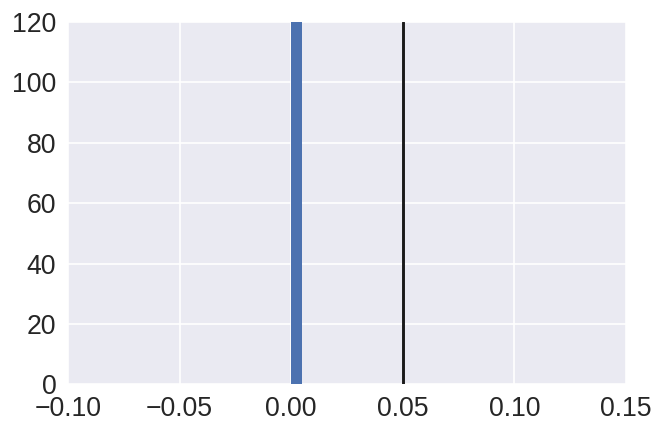

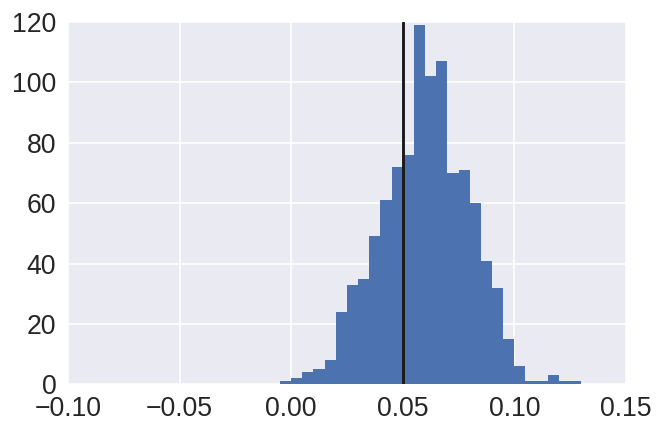

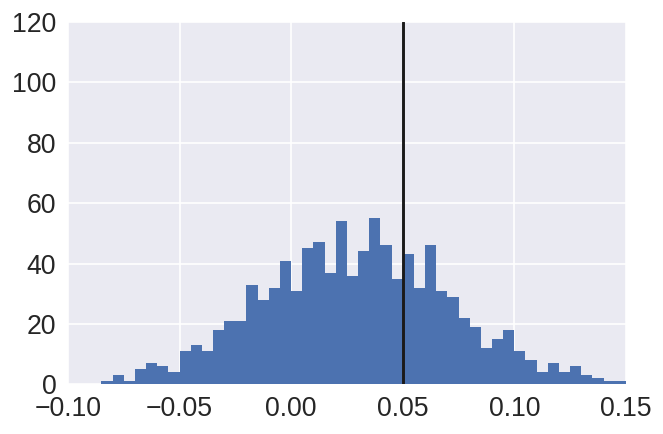

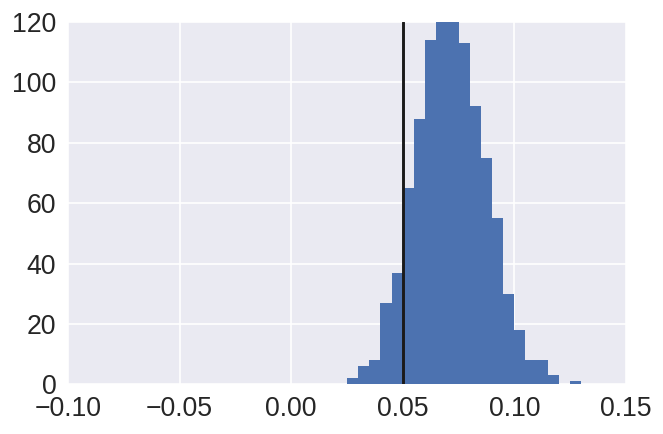

In [68]:
predictions_hist(predictions[3], mp.jumps_mu, 
                 "Convolutional Architecture - Multiple Output - ReLU", 
                 "Jumps Mu",
                 min_edge = -0.1,
                 max_edge = 0.15,
                 y_lim = (0, 120),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ReLU/");

predictions_hist(predictions_elu[3], mp.jumps_mu, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Jumps Mu",
                 min_edge = -0.1,
                 max_edge = 0.15,
                 y_lim = (0, 120),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ELU/");

predictions_hist(predictions_ff[3], mp.jumps_mu, 
                 "Fully Connected Architecture - Multiple Output - ELU", 
                 "Jumps Mu",
                 min_edge = -0.1,
                 max_edge = 0.15,
                 y_lim = (0, 120),
                 img_subdir = "/Images/Parameter-Prediction-Results/FullyConnected-MultipleOutput-ELU/");





In [228]:
single_param_predictions_lambda = covnet_lambda.predict(test_set_pred)

/Users/Rayno/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.


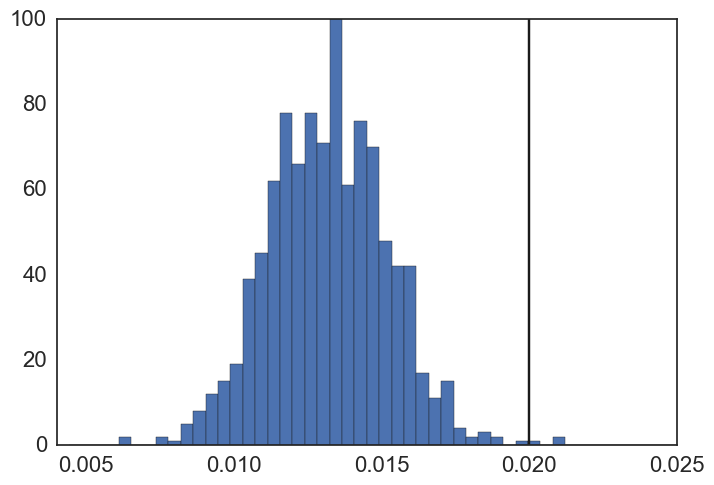

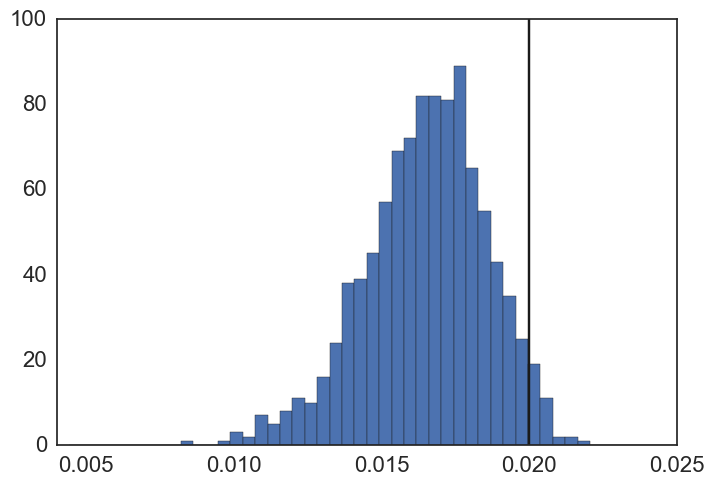

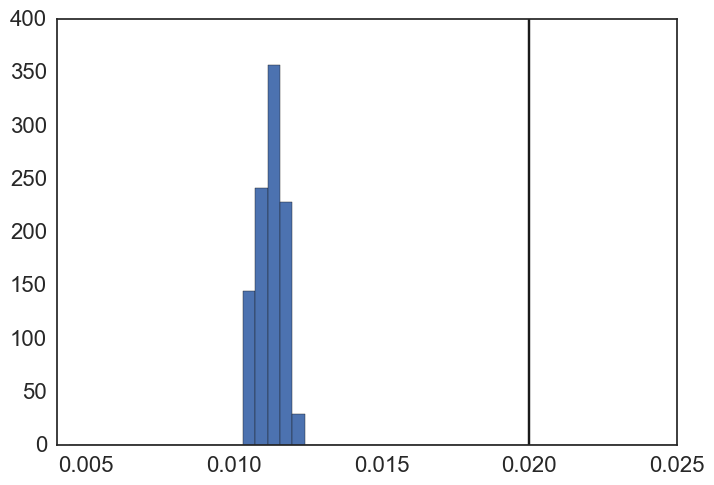

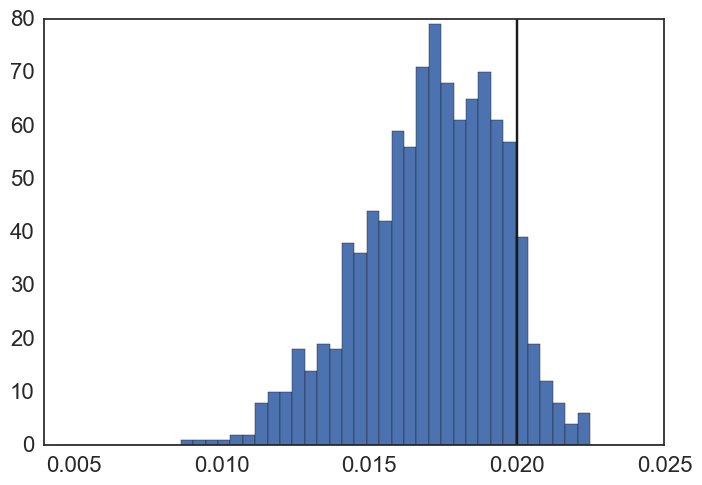

In [229]:
predictions_hist(predictions[4], mp.lamda, 
                 "Convolutional Architecture - Multiple Output - ReLU", 
                 "Lambda",
                 min_edge = 0.004,
                 max_edge = 0.025,
                 y_lim = (0, 100),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ReLU/");

predictions_hist(predictions_elu[4], mp.lamda, 
                 "Convolutional Architecture - Multiple Output - ELU", 
                 "Lambda",
                 min_edge = 0.004,
                 max_edge = 0.025,
                 y_lim = (0, 100),
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-MultipleOutput-ELU/");

predictions_hist(predictions_ff[4], mp.lamda, 
                 "Fully Connected Architecture - Multiple Output - ELU", 
                 "Lambda",
                 min_edge = 0.004,
                 max_edge = 0.025,
                 img_subdir = "/Images/Parameter-Prediction-Results/FullyConnected-MultipleOutput-ELU/");

predictions_hist(single_param_predictions_lambda, mp.lamda, 
                 "Convolutional Architecture - Single Output - ELU", 
                 "Lambda",
                 min_edge = 0.004,
                 max_edge = 0.025,
                 img_subdir = "/Images/Parameter-Prediction-Results/ConvolutionalNN-SingleOutput/");

In [230]:
predictionset = []
for return_set in test_set:
    prediction = []
    output1 = covnet_mo.predict(np.array([return_set]))
    output2 = covnet_lambda.predict(np.array([return_set]))
    output3 = covnet_jump_mu.predict(np.array([return_set]))
    output4 = covnet_jump_sigma.predict(np.array([return_set]))
    for output in output1:
        prediction.append(output[0][0])
    prediction.append(output2[0][0])
    prediction.append(output3[0][0])
    prediction.append(output4[0][0])
    predictionset.append(prediction)
        

ValueError: Error when checking : expected input_1 to have 4 dimensions, but got array with shape (1, 2000)

In [140]:
preds = ff_ensembling.predict(np.array(predictionset))
np.transpose(preds)[4]

array([ 0.01691603,  0.01632243,  0.01698936,  0.01676064,  0.01561777,
        0.01054441,  0.01768478,  0.01457271,  0.01843683,  0.0168693 ,
        0.01600389,  0.01638517,  0.01507611,  0.01610111,  0.01592271,
        0.01314703,  0.01490481,  0.01501949,  0.01693797,  0.0158531 ,
        0.01357409,  0.01453476,  0.01619878,  0.01712601,  0.01705366,
        0.01701345,  0.01510824,  0.01401103,  0.01599672,  0.01452127,
        0.01559582,  0.01589513,  0.01460927,  0.01527657,  0.01505311,
        0.01708319,  0.01674977,  0.01409111,  0.01417134,  0.01625022,
        0.01263396,  0.01482027,  0.01782426,  0.01611951,  0.01677342,
        0.01678674,  0.01415386,  0.01049334,  0.01216156,  0.01326275,
        0.01669437,  0.01207872,  0.01877503,  0.01535229,  0.01533715,
        0.01729877,  0.01627471,  0.01411244,  0.01586549,  0.01619226,
        0.01433229,  0.01356581,  0.01351994,  0.01609074,  0.0183733 ,
        0.01745659,  0.01566325,  0.01088837,  0.01553585,  0.01

In [94]:
lambdas = np.transpose(preds)[4]

bin_size = 0.0005; min_edge = np.min(lambdas)-0.003; max_edge = np.max(lambdas)
N = (max_edge-min_edge)/bin_size; Nplus1 = N + 1
bin_list = np.linspace(min_edge, max_edge, Nplus1)

plt.hist(lambdas, bins=bin_list);
plt.title("Single Output:  Lambda with true value = "+str(mp.lamda));
plt.axvline(x=mp.lamda, c='k')
plt.show();

NameError: name 'preds' is not defined

In [95]:
jump_mus = np.transpose(preds)[3]

bin_size = 0.0025; min_edge = np.min(jump_mus)-0.03; max_edge = np.max(jump_mus)
N = (max_edge-min_edge)/bin_size; Nplus1 = N + 1
bin_list = np.linspace(min_edge, max_edge, Nplus1)

plt.hist(jump_mus, bins=bin_list);
plt.axvline(x=mp.jumps_mu, c='k')
plt.title("Multiple Output: Mu_jumps with true value = "+str(mp.jumps_mu));
plt.show();

NameError: name 'preds' is not defined

In [96]:
jump_sigmas = np.transpose(preds)[2]

bin_size = 0.0025; min_edge = np.min(jump_sigmas)-0.025; max_edge = np.max(jump_sigmas)
N = (max_edge-min_edge)/bin_size; Nplus1 = N + 1
bin_list = np.linspace(min_edge, max_edge, Nplus1)

plt.hist(jump_sigmas, bins=bin_list);
plt.title("Multiple Output: Sigma_jumps with true value = "+str(mp.jumps_sigma));
plt.axvline(x=mp.jumps_sigma, c='k')
plt.show();

NameError: name 'preds' is not defined

In [97]:
preds

NameError: name 'preds' is not defined

In [98]:
random_seed = System.currentTimeMillis()
print(random_seed)

NameError: name 'System' is not defined

In [99]:
mp = random_model_params()
mp.gbm_mu = 0.1
mp.all_sigma = 0.1
mp.lamda = 0.02
mp.jumps_mu = 0.1
mp.jumps_sigma = 0.05

nrand.seed(random_seed)
random.seed(random_seed)
RETURNS_ = np.exp(geometric_brownian_motion_jump_diffusion_log_returns(mp))

NameError: name 'random_seed' is not defined

In [147]:
path1 = [1]
for i in range(len(RETURNS_)):
    path1.append(path1[i]*RETURNS_[i])

In [148]:
nrand.seed(random_seed)
random.seed(random_seed)
return_set = np.reshape(np.array(geometric_brownian_motion_jump_diffusion_log_returns(mp)), (40, 50, 1))

output1 = covnet_mo.predict(np.array([return_set]))
output2 = covnet_lambda.predict(np.array([return_set]))
output3 = covnet_jump_mu.predict(np.array([return_set]))
output4 = covnet_jump_sigma.predict(np.array([return_set]))
prediction = []

for output in output1:
    prediction.append(output[0][0])
prediction.append(output2[0][0])
prediction.append(output3[0][0])
prediction.append(output4[0][0])    

NameError: name 'covnet_jump_mu' is not defined

In [149]:
preds = covnet_mo_elu.predict(np.array([return_set]))

In [150]:
mp.all_sigma = preds[0][0][0]
mp.gbm_mu = preds[1][0][0]
mp.jumps_sigma = preds[2][0][0]
mp.jumps_mu = preds[3][0][0]
mp.lamda = preds[4][0][0]

In [151]:
preds

[array([[ 0.09844978]], dtype=float32),
 array([[ 0.1436843]], dtype=float32),
 array([[ 0.05143144]], dtype=float32),
 array([[ 0.08872665]], dtype=float32),
 array([[ 0.01675574]], dtype=float32)]

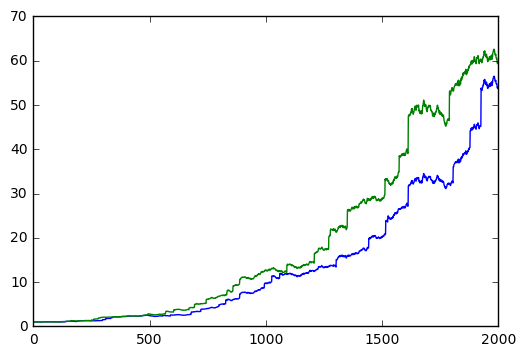

In [152]:
nrand.seed(random_seed)
random.seed(random_seed)
RETURNS_ = np.exp(geometric_brownian_motion_jump_diffusion_log_returns(mp))
path2 = [1]
for i in range(len(RETURNS_)):
    path2.append(path2[i]*RETURNS_[i])
plt.plot(path2);
plt.plot(path1);

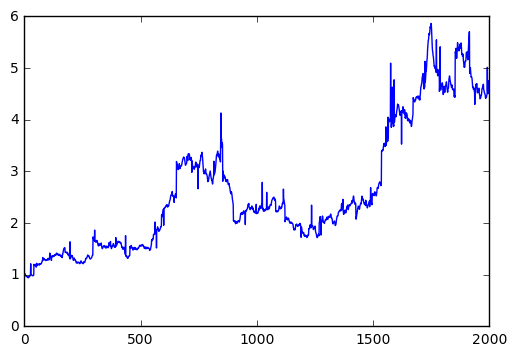